### Interpolation of filtered Eulerian fields over drifters trajectories

In [1]:
import numpy as np
import geopandas as gpd


import xarray as xr
from matplotlib import pyplot as plt
%matplotlib inline

from xhistogram.xarray import histogram
import dask.dataframe as dd
#import cartopy.crs as ccrs
#import cartopy.feature as cfeature

import mitequinox.utils as ut
from mitequinox.plot import *
import mitequinox.parcels as pa
from xmitgcm import llcreader

from scipy import signal
import scipy.ndimage as im

from sympy import Symbol, pi, atan, factor, lambdify

import mitequinox.plot as pl
import mitequinox.sigp as sp
import pyinterp

from fsspec.implementations.local import LocalFileSystem

INFO: Compiled ParcelsRandom ==> /dev/shm/pbs.8241748.datarmor0/parcels-502090/libparcels_random_5847a0f7-e7a1-4bc0-b883-4941073f4584.so


In [ ]:
cluster.close()

In [2]:
from dask.distributed import Client, LocalCluster
#
#cluster = LocalCluster()
#
from dask_jobqueue import PBSCluster
cluster = PBSCluster() #processes=7, cores=7
w = cluster.scale(jobs=8
                 )
#
client = Client(cluster)

In [3]:
def convolve(x, h=None, hilbert=False):
    """ Convolve an input signal with a kernel
    Optionaly compute the Hilbert transform of the resulting time series
    """
    #x_f = im.convolve1d(x, h, axis=1, mode='constant')
    x_f = signal.filtfilt(h, [1], x, axis=-1,padlen=0)#
    if hilbert:
        return signal.hilbert(x_f)
    else:
        return x_f

def filt(v, h, hilbert=False):
    output_dtype = complex if hilbert else float
    gufunc_kwargs = dict(output_sizes={'time': len(v.time)})
    return xr.apply_ufunc(convolve, v, kwargs={'h': h, 'hilbert': hilbert},
                    dask='parallelized', output_dtypes=[output_dtype],
                    input_core_dims=[['time']],
                    output_core_dims=[['time']],
                    dask_gufunc_kwargs = gufunc_kwargs,
                         )

In [85]:
def interp_trajectories(df_sub,v,part=None):
    """
    Interpolate Eulerian mean field over simulated drifters trajectories usin inverse distance weigthing method.
    
    Parameters:
    ----------
    df_sub : dask dataframe
    v : Variable to be interpolated
    Returns:
    ----------
    df_sub : input dask dataframe with an additional column of interpolated field
    """     
    with dask.config.set(schedulers='threads'):
#    ds = xr.open_zarr(ut.work_data_dir+'filtered_itide/SSU_filtered_face7.zarr')
        ds = xr.open_zarr(ut.work_data_dir+'rechunked/SSU_rot.zarr')
            #grd = ut.load_grd(V=['XC','YC','CS','SN'])
            #ds = xr.merge([ds,grd]).isel(face=7)
        sel_interp = dict(i=slice(2500,2900), j=slice(2300,3400))
        ds = ds.isel(face=7).sel(**sel_interp)
        ds = ds.chunk({'time':-1})#.persist()#,'i':1,'j':1})
        #ds.load()
    #t = df_sub.index.values
    #ds.load()
    mesh = pyinterp.RTree()
    #try:
    _dsi = ds.sel(time=df_sub.index.values)#.persist()#index
    #_dsi = _dsi.chunk({'i':1,'j':1})#.compute()
    if part:
        if part=='real':
            var = _dsi[v].real.to_array().values#.flatten()
        elif part=='imag':
            var = _dsi[v].imag.to_array().values#.flatten()
    else:
        var = np.real(_dsi[v].values)#.flatten()
#    var = var
    print(var)

    
    #print(_dsi.XC.shape)
    mesh.packing(np.vstack((_dsi.XC.values.flatten(), 
                            _dsi.YC.values.flatten())).T,
                    var.flatten()
                )

    idw_eta, neighbors = mesh.inverse_distance_weighting(
            np.vstack((df_sub.lon[:], df_sub.lat[:])).T,
            within=True,
            radius=None,
            k=4,  
            num_threads=0)

    df_sub[v[0]+'_'+part+'_interp'] = idw_eta
   # except:
   #     df_sub[v+'_interp'] = np.nan

    return  df_sub

In [5]:
root_dir = '/home/datawork-lops-osi/equinox/mit4320/parcels/'
run_name = 'global_extra_T365j_dt1j_dij50'

#parcels_index = 'time_mean'
parcels_index = "L_filtered_T30_sdband04"
# choose to select time indexed data for now
p = pa.parcels_output(root_dir+run_name, parquets=[parcels_index])
df = p[parcels_index]
df = pa.degs2ms(df)
df.head()

,trajectory,lat,lon,z,zonal_velocity,meridional_velocity,sea_level,dt_flag,zonal_velocity_hat_real,zonal_velocity_hat_imag,zonal_velocity_demodulated_real,zonal_velocity_demodulated_imag,meridional_velocity_hat_real,meridional_velocity_hat_imag,meridional_velocity_demodulated_real,meridional_velocity_demodulated_imag
time,,,,,,,,,,,,,,,,
2011-11-15,2000384,-68.021919,-19.239584,0.0,0.0,0.0,0.0,False,0.004085,0.000697,0.004085,0.000697,0.002623,0.004498,0.002623,0.004498
2011-11-15,48000573,55.309990,-40.197918,0.0,0.0,0.0,0.0,False,0.017263,-0.016716,0.017263,-0.016716,-0.005707,0.016081,-0.005707,0.016081
2011-11-15,48000631,44.620720,-37.072918,0.0,0.0,0.0,0.0,False,0.006110,-0.020936,0.006110,-0.020936,0.027630,-0.014982,0.027630,-0.014982
2011-11-15,49000118,64.051880,-88.307640,0.0,0.0,0.0,0.0,False,-0.180781,-0.079333,-0.180781,-0.079333,-0.485498,0.112855,-0.485498,0.112855
2011-11-15,49000872,64.252319,-36.253830,0.0,0.0,0.0,0.0,False,0.034166,0.012898,0.034166,0.012898,-0.028217,0.020949,-0.028217,0.020949


In [6]:
_df = df[df.trajectory==37000248].compute()
#_df = df[df.trajectory==37000248].persist()
#_df = _df.reset_index()

In [56]:
_dfi = _df.loc[_df.index.values[0]:_df.index.values[2]]

In [64]:
def myfunc(df_sub,ds,v):
    print(df_sub.index.values)
    _ds = ds.sel(time=df_sub.index.values)
    var = _ds[v].to_array().values.flatten()
    print( var)
    return df_sub

In [45]:
_dsi['SSU_rot'].values.flatten()


array([-0.05729302, -0.03765842, -0.0169111 , ...,  0.11764268,
        0.10526559,  0.08443062], dtype=float32)

In [65]:
_dfi.groupby(_dfi.index).apply(myfunc,ds,['SSU_rot'])

['2011-11-15T00:00:00.000000000']
[-0.04041441 -0.03308421 -0.01915144 ...  0.1210816   0.12984708
  0.134076  ]
['2011-11-15T01:00:00.000000000']
[0.00147203 0.00922219 0.01315963 ... 0.11506253 0.10627871 0.1111748 ]
['2011-11-15T02:00:00.000000000']
[-0.05729302 -0.03765842 -0.0169111  ...  0.11764268  0.10526559
  0.08443062]


,trajectory,lat,lon,z,zonal_velocity,meridional_velocity,sea_level,dt_flag,zonal_velocity_hat_real,zonal_velocity_hat_imag,zonal_velocity_demodulated_real,zonal_velocity_demodulated_imag,meridional_velocity_hat_real,meridional_velocity_hat_imag,meridional_velocity_demodulated_real,meridional_velocity_demodulated_imag
time,,,,,,,,,,,,,,,,
2011-11-15 00:00:00,37000248,40.765976,-169.489578,0.0,0.000000,0.000000,0.000000,False,0.001536,-0.005739,0.001536,-0.005739,0.004674,0.001765,0.004674,0.001765
2011-11-15 01:00:00,37000248,40.761000,-169.493875,0.0,-6221.208866,-14253.552734,0.722748,False,0.005527,-0.006190,0.001763,-0.008108,0.000686,0.007112,0.004098,0.005853
2011-11-15 02:00:00,37000248,40.755319,-169.499475,0.0,-10658.427156,-19703.960938,0.606409,False,0.009073,-0.003841,0.001383,-0.009755,-0.003228,0.006077,0.003545,0.005898


In [79]:
ds = xr.open_zarr(ut.work_data_dir+'rechunked/SSU_rot.zarr')
        #grd = ut.load_grd(V=['XC','YC','CS','SN'])
        #ds = xr.merge([ds,grd]).isel(face=7)
sel_interp = dict(i=slice(2500,2900), j=slice(2300,3400))
ds = ds.isel(face=7).sel(**sel_interp)
ds = ds.chunk({'time':-1})#.persist()#,'i':1,'j':1})
        #ds.load()
    #t = df_sub.index.values
mesh = pyinterp.RTree()
    #try:
_dsi = ds.sel(time=_dfi.index.values[2])

In [34]:
_dsi['SSU_rot'].real.values.flatten()

array([-0.05729302, -0.03765842, -0.0169111 , ...,  0.11764268,
        0.10526559,  0.08443062], dtype=float32)

In [35]:
_dfi = _dfi.reset_index()

In [86]:
import dask
test = _dfi.groupby(_dfi.index).apply(interp_trajectories,['SSU_rot'],part='real')

[[[[-0.04041441 -0.03308421 -0.01915144 ...  0.07804535  0.08242668
     0.08438541]
   [-0.05230556 -0.04170737 -0.02452445 ...  0.08863528  0.09580867
     0.09674418]
   [-0.04659472 -0.03572091 -0.02261611 ...  0.10665296  0.11732274
     0.11838359]
   ...
   [ 0.216103    0.21021652  0.21100119 ...  0.1310522   0.1272836
     0.12481178]
   [ 0.22293302  0.22378746  0.22518706 ...  0.11822611  0.12371838
     0.13002251]
   [ 0.23795979  0.24061288  0.24054351 ...  0.1210816   0.12984708
     0.134076  ]]]]
[[[[0.00147203 0.00922219 0.01315963 ... 0.09250333 0.10044263
    0.11247304]
   [0.00687874 0.01641095 0.01705354 ... 0.09345655 0.09817783
    0.10467823]
   [0.00072597 0.00842276 0.00625463 ... 0.09504166 0.0993434
    0.10202815]
   ...
   [0.23736626 0.25009432 0.2662866  ... 0.10070854 0.10080134
    0.09463252]
   [0.27152628 0.27996266 0.28610343 ... 0.09657378 0.09633094
    0.10251681]
   [0.30261564 0.31259257 0.31176    ... 0.11506253 0.10627871
    0.1111748 ]]]

In [87]:
test

,trajectory,lat,lon,z,zonal_velocity,meridional_velocity,sea_level,dt_flag,zonal_velocity_hat_real,zonal_velocity_hat_imag,zonal_velocity_demodulated_real,zonal_velocity_demodulated_imag,meridional_velocity_hat_real,meridional_velocity_hat_imag,meridional_velocity_demodulated_real,meridional_velocity_demodulated_imag,SSU_rot_real_interp
time,,,,,,,,,,,,,,,,,
2011-11-15 00:00:00,37000248,40.765976,-169.489578,0.0,0.000000,0.000000,0.000000,False,0.001536,-0.005739,0.001536,-0.005739,0.004674,0.001765,0.004674,0.001765,-0.069298
2011-11-15 01:00:00,37000248,40.761000,-169.493875,0.0,-6221.208866,-14253.552734,0.722748,False,0.005527,-0.006190,0.001763,-0.008108,0.000686,0.007112,0.004098,0.005853,-0.124601
2011-11-15 02:00:00,37000248,40.755319,-169.499475,0.0,-10658.427156,-19703.960938,0.606409,False,0.009073,-0.003841,0.001383,-0.009755,-0.003228,0.006077,0.003545,0.005898,-0.141907


In [88]:
#client.restart()
cluster.close()

Exception ignored in: <bound method GCDiagnosis._gc_callback of <distributed.utils_perf.GCDiagnosis object at 0x2aabaec63490>>
Traceback (most recent call last):
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/utils_perf.py", line 192, in _gc_callback
    self._fractional_timer.start_timing()
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/utils_perf.py", line 115, in start_timing
    assert self._cur_start is None
AssertionError: 
distributed.client - ERROR - Failed to reconnect to scheduler after 10.00 seconds, closing client
ERROR:asyncio:_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
asyncio.exceptions.CancelledError


In [25]:
_df = _df.dropna()#.persist()

df_drop = _df.groupby('trajectory').apply(remove_duplicates
                                   ).drop(columns='trajectory').reset_index().set_index('time')#.persist()

In [28]:
_df['t_bis'] = _df.index

In [90]:
_df = _df.persist()

In [93]:
def myfunc(df_sub):
    t = df_sub.t_bis.values
    print(t)
    df_sub['t'] = t
    return df_sub

In [94]:
test = _df.groupby('time').apply(myfunc).compute()

['1970-01-01T00:00:00.000000000' '1970-01-01T00:00:00.000000000']


<ipython-input-94-d62c59ad779b>:1: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  test = _df.groupby('time').apply(myfunc).compute()


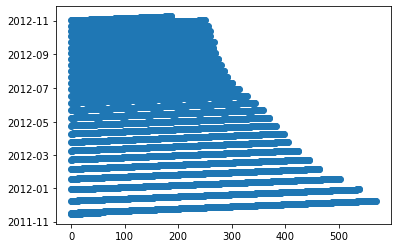

In [84]:
plt.scatter(test.index,test.t)

In [39]:
_df.groupby('time').apply(lambda x: x.index).compute()

<ipython-input-39-8685b9217938>:1: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  _df.groupby('time').apply(lambda x: x.index).compute()


time
2012-02-16 23:00:00    Int64Index([10], dtype='int64')
2012-05-18 10:00:00     Int64Index([4], dtype='int64')
2012-10-26 05:00:00     Int64Index([8], dtype='int64')
2011-12-10 11:00:00     Int64Index([6], dtype='int64')
2011-12-23 07:00:00     Int64Index([3], dtype='int64')
                                    ...               
2012-05-24 01:00:00     Int64Index([5], dtype='int64')
2012-06-26 16:00:00     Int64Index([4], dtype='int64')
2012-09-15 08:00:00     Int64Index([1], dtype='int64')
2012-10-22 03:00:00     Int64Index([5], dtype='int64')
2012-11-06 10:00:00     Int64Index([4], dtype='int64')
Length: 8642, dtype: object

In [29]:
test = _df[0:10]

In [34]:
import dask
df_interp = test.groupby('t_bis').apply(interp_trajectories,['SSU_rot'])#.persist()

KeyboardInterrupt: 

In [35]:
cluster.close()

In [5]:
def interp_sig(_df, dsi,v,time,method=None,part=None):
    idw_eta, neighbors = [],[]
    idw_eta_mid, neighbors_mid = [],[]
    
    for it in range(0,_df.index.values.size):
    #for t in time
        mesh = pyinterp.RTree()
        _dsi = dsi.isel(time=it)#
        if part=='real':
            var = np.real(_dsi[v].values)
        elif part=='imag':
            var = np.imag(_dsi[v].values)
        elif part=='abs':
            var = np.abs(_dsi[v].values)
        elif part=='angle':
            var = np.angle(_dsi[v].values)
        else:
            var = _dsi[v].values
        mesh.packing(np.vstack((_dsi.XC.values.flatten(), 
                                _dsi.YC.values.flatten())).T,
                         var.flatten(),
                        )
        if method:
            idw_eta.append(mesh.radial_basis_function(
                    np.vstack((_df.lon[it], _df.lat[it])).T,
                    within=True,
                    radius=None,
                    k=4,  
                    num_threads=0,
                    rbf=method)[0])
            neighbors.append(mesh.radial_basis_function(
                    np.vstack((_df.lon[it], _df.lat[it])).T,
                    within=True,
                    radius=None,
                    k=4,
                    num_threads=0,
                    rbf=method)[1])
#            idw_eta_mid.append(mesh.radial_basis_function(
#                        np.vstack((np.real(_df.lon[time.size//2]), np.real(_df.lat[time.size//2]))).T,
#                        within=True,
#                        radius=None,
#                        k=4, 
#                       num_threads=0,
#                        rbf=method)[0])
#            neighbors_mid.append(mesh.radial_basis_function(
#                        np.vstack((np.real(_df.lon[time.size//2]), np.real(_df.lat[time.size//2]))).T,
#                        within=True,
#                        radius=None,
#                        k=4,  
#                        num_threads=0,
#                        rbf=method)[1])
        else:    
            idw_eta.append(mesh.inverse_distance_weighting(
                    np.vstack((_df.lon[it], _df.lat[it])).T,
                    within=True,
                    radius=None,
                    k=4,  
                    num_threads=0)[0])
            neighbors.append(mesh.inverse_distance_weighting(
                    np.vstack((_df.lon[it], _df.lat[it])).T,
                    within=True,
                    radius=None,
                    k=4,  
                    num_threads=0)[1])
#            idw_eta_mid.append(mesh.inverse_distance_weighting(
#                        np.vstack((np.real(_df.lon[time.size//2]), np.real(_df.lat[time.size//2]))).T,
#                        within=True,
#                        radius=None,
#                        k=4,  
#                        num_threads=0)[0])
#            neighbors_mid.append(mesh.inverse_distance_weighting(
#                        np.vstack((np.real(_df.lon[time.size//2]), np.real(_df.lat[time.size//2]))).T,
#                       within=True,
#                        radius=None,
#                        k=4,  
#                        num_threads=0)[1])
    interp = idw_eta[0]
    for i in idw_eta[1:]:
        interp = np.insert(i,-1,interp)
#    interp_mid = idw_eta_mid[0]
#    for i in idw_eta_mid[1:]:
#        interp_mid = np.insert(i,-1,interp_mid)
    return interp#, interp_mid

In [6]:
isel = dict(face=7)
sel = dict(i=slice(2700,2900), j=slice(2900,3100))#, i_g=slice(3000,3100), j_g=slice(3000,3100)) # North East Hawaii
sel_interp = dict(i=slice(2500,2900), j=slice(2300,3400))

In [7]:
ds = xr.merge([xr.open_zarr(ut.work_data_dir+'rechunked/SSU.zarr'),xr.open_zarr(ut.work_data_dir+'rechunked/SSV.zarr')#,
#               xr.open_zarr(ut.work_data_dir+'rechunked/Eta.zarr')
              ])
grd = ut.load_grd()[['XC', 'YC', 'Depth']].persist()
ds['lon'] = 0*ds.face+grd.XC
ds['lat'] = 0*ds.face+grd.YC
ds = ds.drop(['i_g','j_g']).rename({'i_g':'i','j_g':'j'})

In [8]:
dsp = ds.isel(**isel).sel(**sel)

dsp = dsp.chunk({"time": -1,'i':10,'j':10}).persist() #,"i":10,"j":10
dsp['zonal_velocity'] = dsp['SSU']*dsp.CS - dsp['SSV']*dsp.SN
dsp['meridional_velocity'] =  dsp['SSU']*dsp.SN + dsp['SSV']*dsp.CS
dsp = dsp.assign_coords({'lon':dsp.lon,'lat':dsp.lat})
dsp = dsp.drop(['SSU','SSV']).persist()

In [ ]:
client.restart()
#cluster.close()

In [20]:
ds_interp = ds.isel(**isel).sel(**sel_interp)

ds_interp = ds_interp.chunk({"time": -1,"i":10,"j":10}).persist() #,"i":10,"j":10
ds_interp['zonal_velocity'] = ds_interp['SSU']*ds_interp.CS - ds_interp['SSV']*ds_interp.SN
ds_interp['meridional_velocity'] =  ds_interp['SSU']*ds_interp.SN + ds_interp['SSV']*ds_interp.CS
ds_interp = ds_interp.assign_coords({'lon':ds_interp.lon,'lat':ds_interp.lat})
ds_interp = ds_interp.drop(['SSU','SSV']).persist()

In [9]:
dt = 1/24 # in days

tidal_omega = sp.get_tidal_frequencies("M2", "K2","S2","N2","K1","O1","M4","S4")
omega_M2,omega_S2,omega_N2,omega_K2, domega, name = tidal_omega["M2"],tidal_omega["S2"],tidal_omega["N2"],tidal_omega["K2"], .2, "semidiurnal"
omega = (omega_M2+omega_S2)/2
omega2 = (omega_M2+omega_S2+omega_N2+omega_K2)/4


lat_mean = dsp.lat.mean().values

f0 = 2*7.2921*1e-5
f = f0*np.sin(2*np.pi*lat_mean/360)*3600*24/(2*np.pi)
f

1.2746185825899081

In [10]:
def wrap_filter(_ds,om,Tw,dband,V,dt=dt):
    h = sp.generate_filter(om, T=Tw, dt=dt, bandwidth=dband, normalized_bandwidth=None)
    time = np.arange(0,_ds['time'].values.size*dt,dt)
    exp = np.exp(-1j*om*2*np.pi*time)
    ds_hat={}
    for v in V:
        ds_hat[v+'_hat'] = filt(_ds[v], h,hilbert=True).persist()
        ds_hat[v+'_hat'] = ds_hat[v+'_hat'].assign_coords({'lon':ds_hat[v+'_hat'].lon,'lat':ds_hat[v+'_hat'].lat})
        ds_hat[v+'_demodulated'] = ds_hat[v+'_hat']*exp
        ds_hat[v+'_demodulated_real']=ds_hat[v+'_demodulated'].real
        ds_hat[v+'_demodulated_imag']=ds_hat[v+'_demodulated'].imag
    ds_hat = xr.merge([ds_hat[v].rename(v) for v in ds_hat.keys()])
    return ds_hat,h

In [11]:
V = ['zonal_velocity','meridional_velocity'
    ]
Tw = 30
dband=0.2 #half bandwidth

ds_hat,h = wrap_filter(dsp,omega,Tw,dband,V)
ds_hat = xr.merge([ds_hat,dsp])

ds_hat_f,h_f = wrap_filter(dsp,f,Tw,dband,V)
ds_hat_f = xr.merge([ds_hat_f,dsp])

ds_hat2,h2 = wrap_filter(dsp,omega2,Tw,dband,V)
ds_hat2 = xr.merge([ds_hat2,dsp])


In [29]:
#ds_hat_interp,h = wrap_filter(ds_interp,omega,Tw,dband,V)
#ds_hat_interp = xr.merge([ds_hat_interp,ds_interp])

In [12]:
root_dir = '/home/datawork-lops-osi/equinox/mit4320/parcels/'
run_name = 'global_extra_T365j_dt1j_dij50'

#parcels_index = 'time_mean'
parcels_index = "L_filtered_T30_sdband04"
# choose to select time indexed data for now
p = pa.parcels_output(root_dir+run_name, parquets=[parcels_index])
df = p[parcels_index]
df = pa.degs2ms(df)
df.head()

,trajectory,lat,lon,z,zonal_velocity,meridional_velocity,sea_level,dt_flag,zonal_velocity_hat_real,zonal_velocity_hat_imag,zonal_velocity_demodulated_real,zonal_velocity_demodulated_imag,meridional_velocity_hat_real,meridional_velocity_hat_imag,meridional_velocity_demodulated_real,meridional_velocity_demodulated_imag
time,,,,,,,,,,,,,,,,
2011-11-15,2000384,-68.021919,-19.239584,0.0,0.0,0.0,0.0,False,0.004085,0.000697,0.004085,0.000697,0.002623,0.004498,0.002623,0.004498
2011-11-15,48000573,55.309990,-40.197918,0.0,0.0,0.0,0.0,False,0.017263,-0.016716,0.017263,-0.016716,-0.005707,0.016081,-0.005707,0.016081
2011-11-15,48000631,44.620720,-37.072918,0.0,0.0,0.0,0.0,False,0.006110,-0.020936,0.006110,-0.020936,0.027630,-0.014982,0.027630,-0.014982
2011-11-15,49000118,64.051880,-88.307640,0.0,0.0,0.0,0.0,False,-0.180781,-0.079333,-0.180781,-0.079333,-0.485498,0.112855,-0.485498,0.112855
2011-11-15,49000872,64.252319,-36.253830,0.0,0.0,0.0,0.0,False,0.034166,0.012898,0.034166,0.012898,-0.028217,0.020949,-0.028217,0.020949


In [13]:
#df = df.drop(columns=['temperature','salinity','Eta_interp','SSU_interp','SSV_interp','SST_interp','SSS_interp'])
lonmin,lonmax,latmin,latmax = dsp.lon.min().values,dsp.lon.max().values,dsp.lat.min().values,dsp.lat.max().values

In [14]:
# extract relevant trajectory indices
bbox=[lonmin,lonmax,latmin,latmax]
_df = df[ (df.lon>=bbox[0])
        &(df.lon<=bbox[1])
        &(df.lat>=bbox[2])
        &(df.lat<=bbox[3])
       ]
traj = _df.drop_duplicates(subset=["trajectory"]).compute()["trajectory"]
#traj = _df.index.drop_duplicates(keep='first').compute()#["index"]

df_selected = df[df.trajectory.isin(traj)]

In [23]:
def remove_duplicates(df):
    df = df.reset_index().drop_duplicates('time').sort_values('time').set_index('time')
    dt_df = df.index[1:]-df.index[:-1]
    df['dt_flag'] = np.insert(dt_df!=np.timedelta64(1,'h'),0,False)
    return df

def filt_L(v, h,columns,om, hilbert=False):
    vc = v.copy()
    #vc = vc.groupby(vc.index).first()#.drop_duplicates
    #vc = vc.groupby(level=df1.index.names).last()
    for V in columns:
        vc[V+'_hat'] = convolve(vc[V],h=h,hilbert=hilbert)
    time = np.arange(0,vc.index.size*dt,dt)#.compute()
    exp = np.exp(-1j*om*2*np.pi*time)
    for V in columns:
        vc[V+'_demodulated'] = vc[V+'_hat']*exp
    return vc

In [17]:
Tw = 30#Tw
dband= 0.2#dband
omega = omega #(omega_M2+omega_S2)/2
hL = sp.generate_filter(omega, T=Tw, dt=dt, bandwidth=dband, normalized_bandwidth=None)



In [19]:
_df = df.dropna().persist()

df_drop = _df.groupby('trajectory').apply(remove_duplicates
                                   ).drop(columns='trajectory').reset_index().set_index('time').persist()

In [20]:
df_filtered = df_drop.groupby('trajectory').apply(filt_L,hL,['zonal_velocity','meridional_velocity']
                                                  ,omega,hilbert=True).persist()
df_filtered = df_filtered.drop(columns='trajectory').reset_index().sort_values('time').set_index('time').persist()

<ipython-input-20-59b10a575e89>:1: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  df_filtered = df_drop.groupby('trajectory').apply(filt_L,hL,['zonal_velocity','meridional_velocity']


KeyboardInterrupt: 

In [8]:
diags_dir = '/home/datawork-lops-osi/equinox/mit4320/filtered_itide/'
ds = xr.open_zarr(diags_dir+'ZC_filtered_itide_face7.zarr').persist()

In [124]:
grd = ut.load_grd(V=['XC','YC','CS','SN'])
#diags_dir = '/home/datawork-lops-osi/equinox/mit4320/diags/'
diags_dir = '/home/datawork-lops-osi/equinox/mit4320/filtered_itide/'
        #if np.isin(v,['SSU','SSV']):
            #ds = xr.merge([ut.load_diagnostic("mean_"+V) for V in ['SSU','SSV']])
#ds = xr.merge([xr.open_zarr(ut.work_data_dir+'rechunked/SSU.zarr'),xr.open_zarr(ut.work_data_dir+'rechunked/SSV.zarr')])#xr.open_zarr(diags_dir+'mean.zarr')[['SSU','SSV']]
ds = xr.open_zarr(diags_dir+'ZC_filtered_itide_face7.zarr')
ds = ds.sel(**sel_interp).persist()
#grd = grd.isel(**isel).sel(**sel_interp).persist()
#s = xr.merge([grd, ds])#.persist()
#ds = ds.chunk({'i':-1,'j':-1}).persist()

In [126]:
ds.XC

<xarray.DataArray 'XC' (j: 551, i: 201)>
dask.array<getitem, shape=(551, 201), dtype=float32, chunksize=(144, 96), chunktype=numpy.ndarray>
Coordinates:
    CS       (j, i) float32 dask.array<chunksize=(2, 94), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(2, 94), meta=np.ndarray>
    SN       (j, i) float32 dask.array<chunksize=(2, 94), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(2, 94), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(2, 94), meta=np.ndarray>
  * i        (i) int64 2500 2502 2504 2506 2508 ... 2892 2894 2896 2898 2900
  * j        (j) int64 2300 2302 2304 2306 2308 ... 3392 3394 3396 3398 3400
    lat      (j, i) float64 dask.array<chunksize=(2, 94), meta=np.ndarray>
    lon      (j, i) float64 dask.array<chunksize=(2, 94), meta=np.ndarray>
    rA       (j, i) float32 dask.array<chunksize=(2, 94), meta=np.ndarray>
Attributes:
    coordinate:     YC XC
    long_name:      longitude
    standard_name:  longitude
    units:          degrees_east

In [ ]:
def interp_trajectories(df_sub,v,part=None):
    """
    Interpolate Eulerian mean field over simulated drifters trajectories usin inverse distance weigthing method.
    
    Parameters:
    ----------
    df_sub : dask dataframe
    v : Variable to be interpolated
    Returns:
    ----------
    df_sub : input dask dataframe with an additional column of interpolated field
    """     
    mesh = pyinterp.RTree()
    #try:
    with dask.config.set(schedulers='threads'):
#        grd = ut.load_grd(V=['XC','YC','CS','SN'])
  #      diags_dir = '/home/datawork-lops-osi/equinox/mit4320/diags/'
        diags_dir = '/home/datawork-lops-osi/equinox/mit4320/filtered_itide/'
            #if np.isin(v,['SSU','SSV']):
                #ds = xr.merge([ut.load_diagnostic("mean_"+V) for V in ['SSU','SSV']])
#        ds = xr.merge([xr.open_zarr(ut.work_data_dir+'rechunked/SSU.zarr'),xr.open_zarr(ut.work_data_dir+'rechunked/SSV.zarr')])#xr.open_zarr(diags_dir+'mean.zarr')[['SSU','SSV']]
        ds = xr.open_zarr(diags_dir+'ZC_filtered_itide_face7.zarr')
        ds = ds.sel(**sel_interp).persist() #.isel(**isel)
#        grd = grd.isel(**isel).sel(**sel_interp).persist()
#        ds = xr.merge([grd, ds])#.persist()
    #    ds = ds.chunk({'i':-1,'j':-1})
            #ds = ds.isel(**isel).sel(**sel_interp)#.isel(i=slice(0,None, 2), j=slice(0,None, 2))
           # U_mean =  ds.SSU.rename({'i_g':'i'})*ds.CS - ds.SSV.rename({'j_g':'j'})*ds.SN
           # V_mean =  ds.SSU.rename({'i_g':'i'})*ds.SN + ds.SSV.rename({'j_g':'j'})*ds.CS
            #ds['SSU'] = U_mean
            #ds['SSV'] = V_mean
            #ds = xr.merge([ds[V] for V in ['SSU','SSV']]).persist()#.load()
    _dsi = ds.sel(time=df_sub.index.values,method='nearest').persist()
    #index
    #if part:
    #    if part=='real':
    #        var = _dsi[v].real.values
    #    elif part=='imag':
    #        var = _dsi[v].imag.values
    #else:
    var = np.real(_dsi[v].values)
    #print(_dsi.XC.shape)
    #print(np.vstack((_dsi.XC.values.flatten(), 
    #                        _dsi.YC.values.flatten())).T.shape, var.shape)
    mesh.packing(np.vstack((_dsi.XC.values.flatten(), 
                            _dsi.YC.values.flatten())).T,
                    var.flatten()
                )

    idw_eta, neighbors = mesh.inverse_distance_weighting(
            np.vstack((df_sub.lon[:], df_sub.lat[:])).T,
            within=True,
            radius=55000,
            k=4,  
            num_threads=0)

    df_sub[v+'_interp'] = idw_eta
   # except:
   #     df_sub[v+'_interp'] = np.nan

    return  df_sub

In [12]:
#_selected
df_selected = df.groupby('trajectory').apply(remove_duplicates
                                                      ).drop(columns='trajectory').reset_index().set_index('time').persist()
df_filtered = df_selected.groupby('trajectory').apply(filt_L,hL,['zonal_velocity','meridional_velocity'],omega,hilbert=True).persist()
#df_filtered = df_filtered.repartition(npartitions=10).persist()

df_filtered = df_filtered.drop(columns='trajectory').reset_index().sort_values('time').set_index('time').persist()

<ipython-input-12-e7a9b41993a4>:2: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  df_selected = df.groupby('trajectory').apply(remove_duplicates


TypeError: '<' not supported between instances of 'int' and 'NoneType'

distributed.core - ERROR - Exception while handling op heartbeat_worker
Traceback (most recent call last):
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/core.py", line 497, in handle_comm
    result = handler(comm, **msg)
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/scheduler.py", line 3820, in heartbeat_worker
    ws._executing = {
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/scheduler.py", line 3821, in <dictcomp>
    parent._tasks[key]: duration for key, duration in executing.items()
KeyError: "('getitem-22e1fbfca6c134c37be2d4528ceffddd', 280)"
distributed.core - ERROR - Exception while handling op heartbeat_worker
Traceback (most recent call last):
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/core.py", line 497, in handle_comm
    result = handler(comm, **msg)
  File "/home1/datahome/zcaspa

In [26]:
dt = 1/24
time = _df1.index.values[int(360//2/dt-5/dt):int(360//2/dt+5/dt)]

In [25]:
time

array(['2012-05-08T00:00:00.000000000', '2012-05-08T01:00:00.000000000',
       '2012-05-08T02:00:00.000000000', '2012-05-08T03:00:00.000000000',
       '2012-05-08T04:00:00.000000000', '2012-05-08T05:00:00.000000000',
       '2012-05-08T06:00:00.000000000', '2012-05-08T07:00:00.000000000',
       '2012-05-08T08:00:00.000000000', '2012-05-08T09:00:00.000000000',
       '2012-05-08T10:00:00.000000000', '2012-05-08T11:00:00.000000000',
       '2012-05-08T12:00:00.000000000', '2012-05-08T13:00:00.000000000',
       '2012-05-08T14:00:00.000000000', '2012-05-08T15:00:00.000000000',
       '2012-05-08T16:00:00.000000000', '2012-05-08T17:00:00.000000000',
       '2012-05-08T18:00:00.000000000', '2012-05-08T19:00:00.000000000',
       '2012-05-08T20:00:00.000000000', '2012-05-08T21:00:00.000000000',
       '2012-05-08T22:00:00.000000000', '2012-05-08T23:00:00.000000000',
       '2012-05-09T00:00:00.000000000', '2012-05-09T01:00:00.000000000',
       '2012-05-09T02:00:00.000000000', '2012-05-09

In [16]:
v = 'SSU_hat'
_df1 = df[df.trajectory==38000248].persist()#37000174

In [159]:
time = _df1.index.values.compute()

In [162]:
t0, t1 = time[int(360//2/dt-5/dt)],time[int(360//2/dt+5/dt)]

In [168]:
_df1.loc[t0]

TypeError: Cannot compare tz-naive and tz-aware timestamps

In [17]:
import dask
v = 'SSU_hat'
df_interp = _df1.groupby(_df1.index).apply(interp_trajectories,v,part='real').persist()

<ipython-input-17-bb3d44f605f9>:3: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  df_interp = _df1.groupby(_df1.index).apply(interp_trajectories,v,part='real').persist()
Task exception was never retrieved
future: <Task finished name='Task-671813' coro=<rpc.__getattr__.<locals>.send_recv_from_rpc() done, defined at /home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/core.py:783> exception=CommClosedError("in <closed TCP>: Stream is closed: while trying to call remote method 'restart'")>
Traceback (most recent call last):
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/comm/tcp.py", line 196, in read
    frames_nbytes = await stream.read_bytes(fmt_size)
tornado.iostream.Strea

In [12]:
df_interp = df_interp.persist()

distributed.core - ERROR - Exception while handling op heartbeat_worker
Traceback (most recent call last):
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/core.py", line 497, in handle_comm
    result = handler(comm, **msg)
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/scheduler.py", line 3820, in heartbeat_worker
    ws._executing = {
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/scheduler.py", line 3821, in <dictcomp>
    parent._tasks[key]: duration for key, duration in executing.items()
KeyError: "('xarray-getitem-21f147eff57570df073eddbdd7fffe90', 4, 0, 0)"
distributed.core - ERROR - Exception while handling op heartbeat_worker
Traceback (most recent call last):
  File "/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/distributed/core.py", line 497, in handle_comm
    result = handler(comm, **msg)
  File "/home1/data

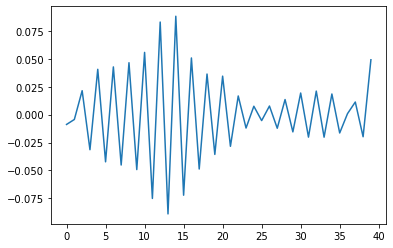

In [154]:
plt.plot(np.real(df_interp.SSU_hat_interp))

In [54]:
def interp_trajectories(df_sub,v,part=None):
    """
    Interpolate Eulerian mean field over simulated drifters trajectories usin inverse distance weigthing method.
    
    Parameters:
    ----------
    df_sub : dask dataframe
    v : Variable to be interpolated
    Returns:
    ----------
    df_sub : input dask dataframe with an additional column of interpolated field
    """     
    mesh = pyinterp.RTree()
    #try:
    #with dask.config.set(schedulers='threads'):
    grd = ut.load_grd(V=['XC','YC','CS','SN'])
    diags_dir = '/home/datawork-lops-osi/equinox/mit4320/diags/'
        #if np.isin(v,['SSU','SSV']):
            #ds = xr.merge([ut.load_diagnostic("mean_"+V) for V in ['SSU','SSV']])
    ds = xr.merge([xr.open_zarr(ut.work_data_dir+'rechunked/SSU.zarr'),xr.open_zarr(ut.work_data_dir+'rechunked/SSV.zarr')])#xr.open_zarr(diags_dir+'mean.zarr')[['SSU','SSV']]
    ds = xr.merge([grd, ds])
    ds = ds.isel(i=slice(0,None, 2), j=slice(0,None, 2))
    U_mean =  ds.SSU.rename({'i_g':'i'})*ds.CS - ds.SSV.rename({'j_g':'j'})*ds.SN
    V_mean =  ds.SSU.rename({'i_g':'i'})*ds.SN + ds.SSV.rename({'j_g':'j'})*ds.CS
    ds['SSU'] = U_mean
    ds['SSV'] = V_mean
    ds = xr.merge([ds[V] for V in ['SSU','SSV']]).load()
    _dsi = ds.sel(time=df_sub.index.values)#index
    #if part:
    #    if part=='real':
    #        var = _dsi[v].real.values
    #    elif part=='imag':
    #        var = _dsi[v].imag.values
    #else:
    if part:
        if part == 'real':
            var = np.real(_dsi[v].values)
        elif part == 'imag':
            var = np.imag(_dsi[v].values)
    else:
        var = _dsi[v].values
    #print(_dsi.XC.shape)
    mesh.packing(np.vstack((_dsi.XC.values.flatten(), 
                            _dsi.YC.values.flatten())).T,
                    var.flatten()
                )

    idw_eta, neighbors = mesh.inverse_distance_weighting(
            np.vstack((df_sub.lon[:], df_sub.lat[:])).T,
            within=True,
            radius=None,
            k=4,  
            num_threads=0)

    df_sub[v+'_interp'] = idw_eta
   # except:
   #     df_sub[v+'_interp'] = np.nan

    return  df_sub

In [ ]:
v = 'zonal_velocity_hat'
_df1 = df_filtered[df_filtered.trajectory==38000248].compute()#37000174
df_interp = _df1.groupby(_df1.index).apply(interp_trajectories,ds_hat_interp,v,part='real')#.persist()

In [19]:
df_filtered_f = df_selected.groupby('trajectory').apply(filt_L,h_f,['zonal_velocity','meridional_velocity'],f,hilbert=True).persist()
#df_filtered = df_filtered.repartition(npartitions=10).persist()

df_filtered_f = df_filtered_f.drop(columns='trajectory').reset_index().sort_values('time').set_index('time').persist()

<ipython-input-19-fdbff4322674>:1: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  df_filtered_f = df_selected.groupby('trajectory').apply(filt_L,h_f,['zonal_velocity','meridional_velocity'],f,hilbert=True).persist()


In [ ]:
df_filtered_f = df_selected.groupby('trajectory').apply(filt_L,h_f,['zonal_velocity','meridional_velocity'],f,hilbert=True).persist()
#df_filtered = df_filtered.repartition(npartitions=10).persist()

df_filtered_f = df_filtered_f.drop(columns='trajectory').reset_index().sort_values('time').set_index('time').persist()

In [16]:
dt = 1/24
t_mid = int(360/dt//2)
dtime = int(5/dt)

dsi = ds_hat.isel(time=slice(int(t_mid-dtime),int(t_mid+dtime)))
#dsi2 = ds_hat2.isel(time=slice(int(t_mid-dtime),int(t_mid+dtime)))
#dsi_f = ds_hat_f.isel(time=slice(int(t_mid-dtime),int(t_mid+dtime)))

df_filtered = df_selected
df1 = df_filtered[df_filtered.trajectory==37000174].compute()
df2 = df_filtered[df_filtered.trajectory==37000248].compute()

#_df1 = df_filtered.loc[dsi.time.values][df_filtered.loc[dsi.time.values].trajectory==37000174].compute()
#_df2 = df_filtered.loc[dsi.time.values][df_filtered.loc[dsi.time.values].trajectory==38000248].compute()

#_df1_2 = df_filtered2.loc[dsi2.time.values][df_filtered2.loc[dsi.time.values].trajectory==37000174].compute()
#_df2_2 = df_filtered2.loc[dsi2.time.values][df_filtered2.loc[dsi.time.values].trajectory==38000248].compute()

#_df1_f = df_filtered_f.loc[dsi.time.values][df_filtered_f.loc[dsi.time.values].trajectory==37000174].compute()
#_df2_f = df_filtered_f.loc[dsi.time.values][df_filtered_f.loc[dsi.time.values].trajectory==38000248].compute()

In [17]:
_df1 = df1.loc[dsi.time.values]
_df2 = df2.loc[dsi.time.values]

In [44]:
#dsi = dsi.chunk({'i':1,'j':1}).persist()

KeyboardInterrupt: 

In [29]:
v = 'zonal_velocity_hat'
df_interp = _df1.groupby(_df1.index).apply(interp_trajectories,dsi,v,part='real')#.persist()

In [30]:
df_interp = df_interp.groupby(df_interp.index).apply(interp_trajectories,dsi,v,part='imag')#.persist()

In [55]:
v = 'zonal_velocity_hat'
df_interp = _df1.groupby(_df1.index).apply(interp_trajectories,v,part='real')#.persist()

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/xarray/core/indexing.py:1369: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/xarray/core/indexing.py:1369: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  r

KeyboardInterrupt: 

<AxesSubplot:xlabel='time'>

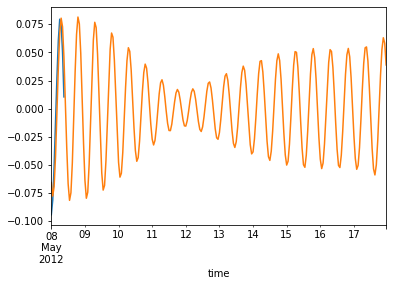

In [45]:
df_interp2.zonal_velocity_hat_real_interp.plot()
df_interp2.zonal_velocity_hat_real.plot()

In [34]:
V = ['meridional_velocity_hat','zonal_velocity_demodulated','meridional_velocity_demodulated']
for v in V:
    df_interp = df_interp.groupby(df_interp.index).apply(interp_trajectories,dsi,v,part='real')#.persist()
    df_interp = df_interp.groupby(df_interp.index).apply(interp_trajectories,dsi,v,part='imag')

In [18]:
V = ['zonal_velocity','meridional_velocity']#,'meridional_velocity'
interp,interp_mid,interp2,interp_mid2 = {},{},{},{}

In [19]:
dsi = dsi.compute()

In [35]:
v = 'zonal_velocity_hat'
df_interp2 = _df2.groupby(_df2.index).apply(interp_trajectories,dsi,v,part='real')#.persist()
df_interp2 = df_interp2.groupby(df_interp2.index).apply(interp_trajectories,dsi,v,part='real')#.persist()

In [36]:
V = ['meridional_velocity_hat','zonal_velocity_demodulated','meridional_velocity_demodulated']
for v in V:
    df_interp2 = df_interp2.groupby(df_interp2.index).apply(interp_trajectories,dsi,v,part='real')#.persist()
    df_interp2 = df_interp2.groupby(df_interp2.index).apply(interp_trajectories,dsi,v,part='imag')

In [37]:
for v in ['zonal_velocity','meridional_velocity']:
    df_interp = df_interp.groupby(df_interp.index).apply(interp_trajectories,dsi,v,part='real')#.persist()
    df_interp2 = df_interp2.groupby(df_interp2.index).apply(interp_trajectories,dsi,v,part='real')#.persist()

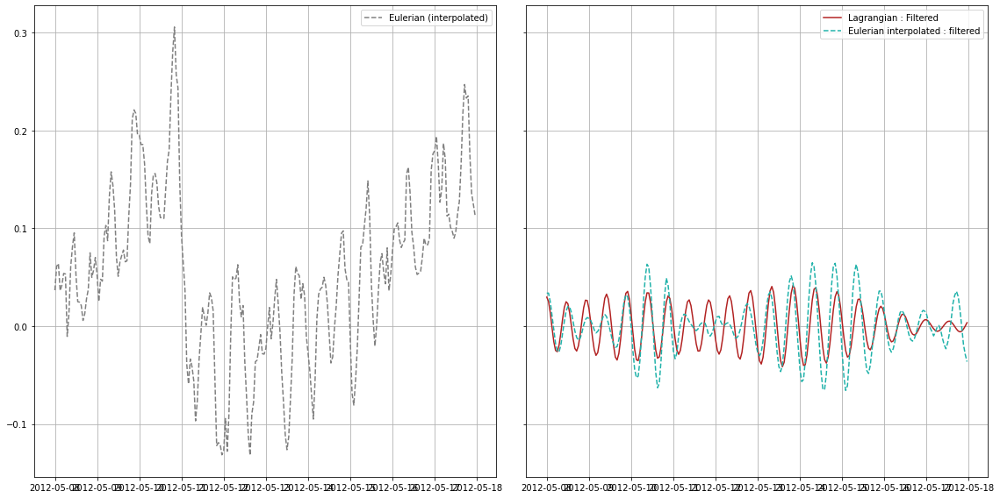

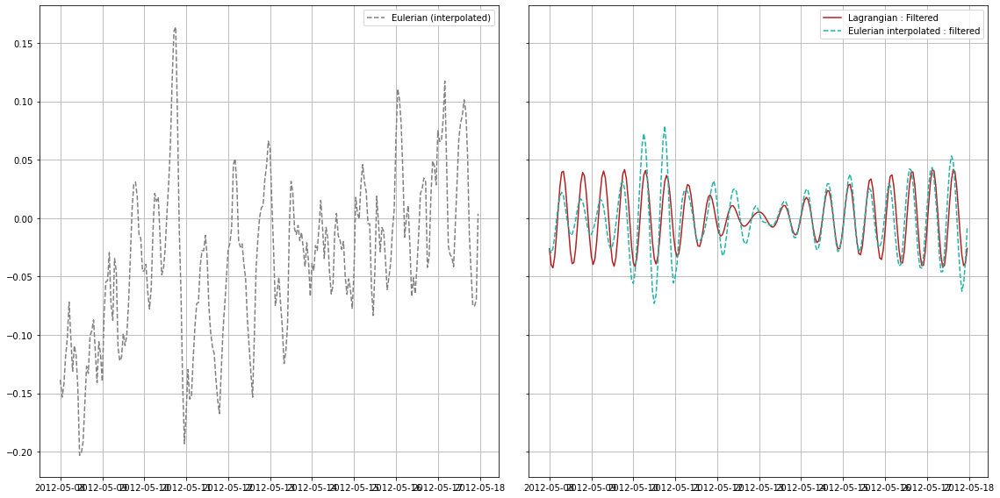

In [48]:
time = _df2.index.values
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
#ax[0].plot(time,_df1[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,df_interp[v+'_real_interp'],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,_df1[v+'_hat_real'],c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,df_interp[v+'_hat_real_interp'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
#ax[0].plot(time,df_interp2[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,df_interp[v+'_real_interp'],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,df_interp[v+'_hat_real'],c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,df_interp[v+'_hat_real_interp'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

Text(0.5, 0.98, 'Imaginary part')

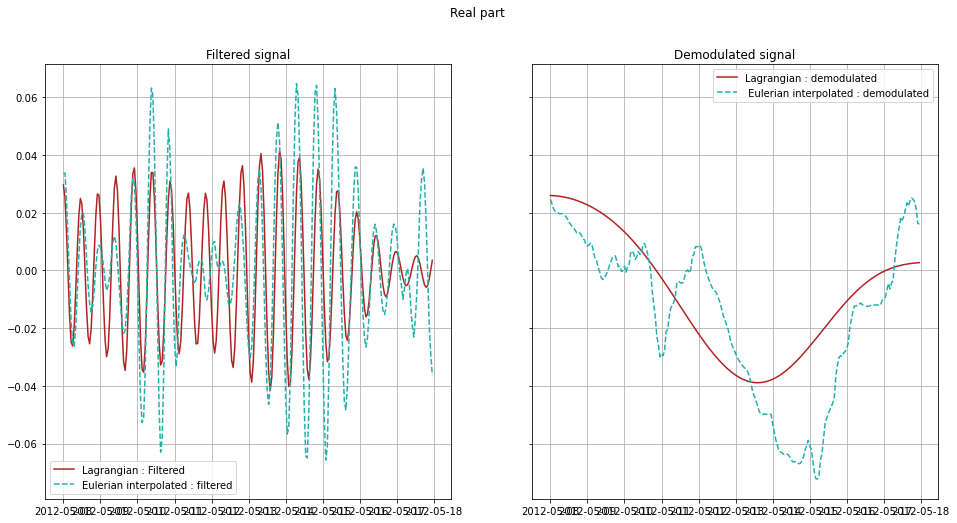

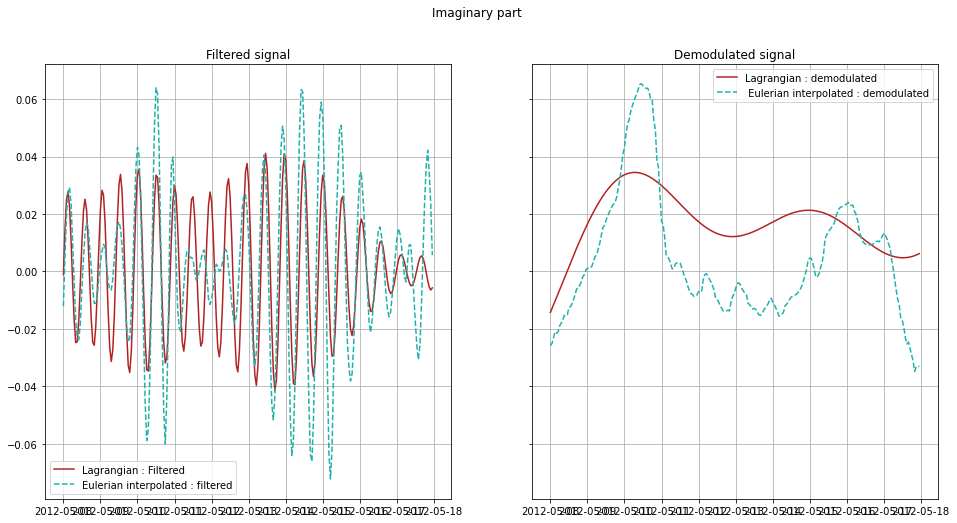

In [51]:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,df_interp[v+'_hat_real'],c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,df_interp[v+'_demodulated_real'],c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,df_interp[v+'_hat_real_interp'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,df_interp[v+'_demodulated_real_interp'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
#ax[1].plot(time,df_interp[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,df_interp[v+'_hat_imag'],c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,(df_interp[v+'_demodulated_imag']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,df_interp[v+'_hat_imag_interp'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,df_interp[v+'_demodulated_imag_interp'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
#ax[1].plot(time,interp_mid2_2[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

In [23]:
for v in V:
    for part in ['real','imag']:
        interp[v+'_hat'+'_'+part] = interp_sig(_df1,dsi,v+'_hat',_df1.index.values,part=part)
        interp2[v+'_hat'+'_'+part] = interp_sig(_df2,dsi,v+'_hat',_df2.index.values,part=part)
        interp[v+'_demodulated'+'_'+part] = interp_sig(_df1,dsi,v+'_demodulated',_df1.index.values,part=part)
        interp2[v+'_demodulated'+'_'+part] = interp_sig(_df2,dsi,v+'_demodulated',_df2.index.values,part=part)

KeyboardInterrupt: 

In [22]:
for v in V:
    for part in ['real','imag']:
        interp[v+'_hat'+'_'+part],interp_mid[v+'_hat'+'_'+part] = interp_sig(_df1,dsi,v+'_hat',
                                                                             _df1.index.values,part=part)
        interp2[v+'_hat'+'_'+part],interp_mid2[v+'_hat'+'_'+part] = interp_sig(_df2,dsi,v+'_hat',
                                                                               _df2.index.values,part=part)
        interp[v+'_demodulated'+'_'+part],interp_mid[v+'_demodulated'+'_'+part] = interp_sig(_df1,dsi,v+'_demodulated',
                                                                                             _df1.index.values,part=part)
        interp2[v+'_demodulated'+'_'+part],interp_mid2[v+'_demodulated'+'_'+part] = interp_sig(_df2,dsi,v+'_demodulated',
                                                                                               _df2.index.values,part=part)

In [23]:
V = ['zonal_velocity','meridional_velocity']
for v in V:
    interp[v],interp_mid[v] = interp_sig(_df1,dsi,v,_df1.index.values,part=None)
    interp2[v],interp_mid2[v] = interp_sig(_df2,dsi,v,_df2.index.values,part=None)

In [25]:
V = ['zonal_velocity','meridional_velocity']
interp_2,interp_mid_2,interp2_2,interp_mid2_2 = {},{},{},{}
for v in V:
    for part in ['real','imag']:
        interp_2[v+'_hat'+'_'+part],interp_mid_2[v+'_hat'+'_'+part] = interp_sig(_df1_2,dsi2,v+'_hat',
                                                                             _df1.index.values,part=part)
        interp2_2[v+'_hat'+'_'+part],interp_mid2_2[v+'_hat'+'_'+part] = interp_sig(_df2_2,dsi,v+'_hat',
                                                                               _df2.index.values,part=part)
        interp_2[v+'_demodulated'+'_'+part],interp_mid_2[v+'_demodulated'+'_'+part] = interp_sig(_df1_2,dsi2,v+'_demodulated',
                                                                                             _df1.index.values,part=part)
        interp2_2[v+'_demodulated'+'_'+part],interp_mid2_2[v+'_demodulated'+'_'+part] = interp_sig(_df2_2,dsi2,v+'_demodulated',
                                                                                               _df2.index.values,part=part)
for v in V:
    interp_2[v],interp_mid_2[v] = interp_sig(_df1_2,dsi2,v,_df1.index.values,part=None)
    interp2_2[v],interp_mid2_2[v] = interp_sig(_df2_2,dsi2,v,_df2.index.values,part=None)

In [26]:
V = ['zonal_velocity_demodulated','meridional_velocity_demodulated']
for v in V:
    interp[v+'_abs'],interp_mid[v+'_abs'] = interp_sig(_df1,dsi,v,_df1.index.values,part='abs')
    interp2[v+'_abs'],interp_mid2[v+'_abs'] = interp_sig(_df2,dsi,v,_df2.index.values,part='abs')
    interp[v+'_angle'],interp_mid[v+'_angle'] = interp_sig(_df1,dsi,v,_df1.index.values,part='angle')
    interp2[v+'_angle'],interp_mid2[v+'_angle'] = interp_sig(_df2,dsi,v,_df2.index.values,part='angle')

In [24]:
V = ['zonal_velocity_demodulated','meridional_velocity_demodulated']
for v in V:
    interp_2[v+'_abs'],interp_mid_2[v+'_abs'] = interp_sig(_df1_2,dsi2,v,_df1.index.values,part='abs')
    interp2_2[v+'_abs'],interp_mid2_2[v+'_abs'] = interp_sig(_df2_2,dsi2,v,_df2.index.values,part='abs')
    interp_2[v+'_angle'],interp_mid_2[v+'_angle'] = interp_sig(_df1_2,dsi2,v,_df1.index.values,part='angle')
    interp2_2[v+'_angle'],interp_mid2_2[v+'_angle'] = interp_sig(_df2_2,dsi2,v,_df2.index.values,part='angle')

In [27]:
V = ['zonal_velocity','meridional_velocity']
interp_f,interp_mid_f,interp2_f,interp_mid2_f = {},{},{},{}
for v in V:
    for part in ['real','imag']:
        interp_f[v+'_hat'+'_'+part],interp_mid_f[v+'_hat'+'_'+part] = interp_sig(_df1_f,dsi_f,v+'_hat',
                                                                             _df1.index.values,part=part)
        interp2_f[v+'_hat'+'_'+part],interp_mid2_f[v+'_hat'+'_'+part] = interp_sig(_df2_f,dsi_f,v+'_hat',
                                                                               _df2.index.values,part=part)
    #    interp_f[v+'_demodulated'+'_'+part],interp_mid_f[v+'_demodulated'+'_'+part] = interp_sig(_df1_f,dsi_f
    #                                                                                             ,v+'_demodulated',
    #                                                                                         _df1.index.values,part=part)
    #    interp2_f[v+'_demodulated'+'_'+part],interp_mid2_f[v+'_demodulated'+'_'+part] = interp_sig(_df2_f,dsi_f
    #                                                                                               ,v+'_demodulated',
    #                                                                                           _df2.index.values,part=part)

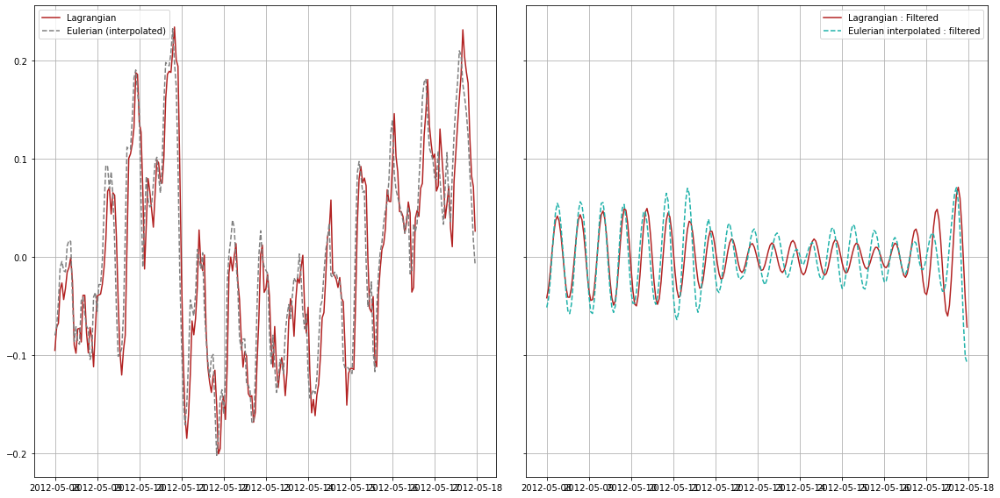

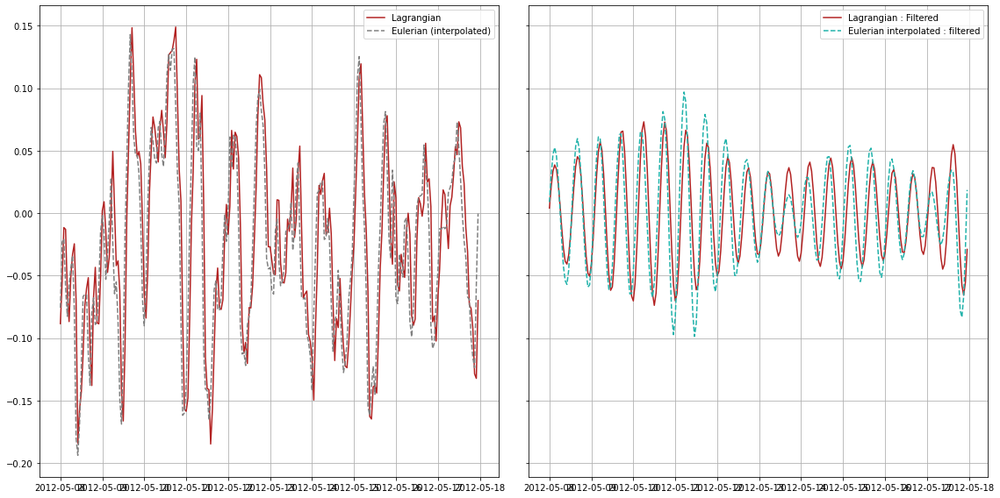

In [32]:
time = _df2.index.values
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df2[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp2[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df2[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp2[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

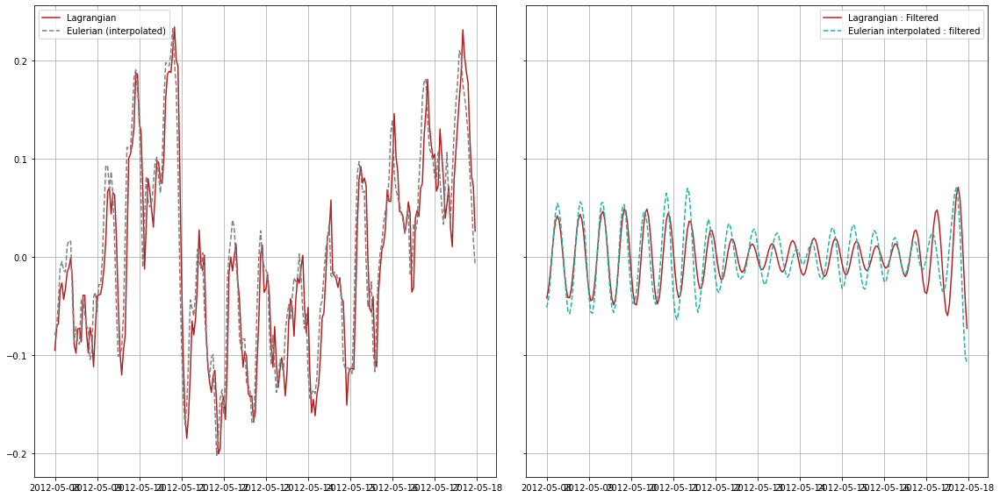

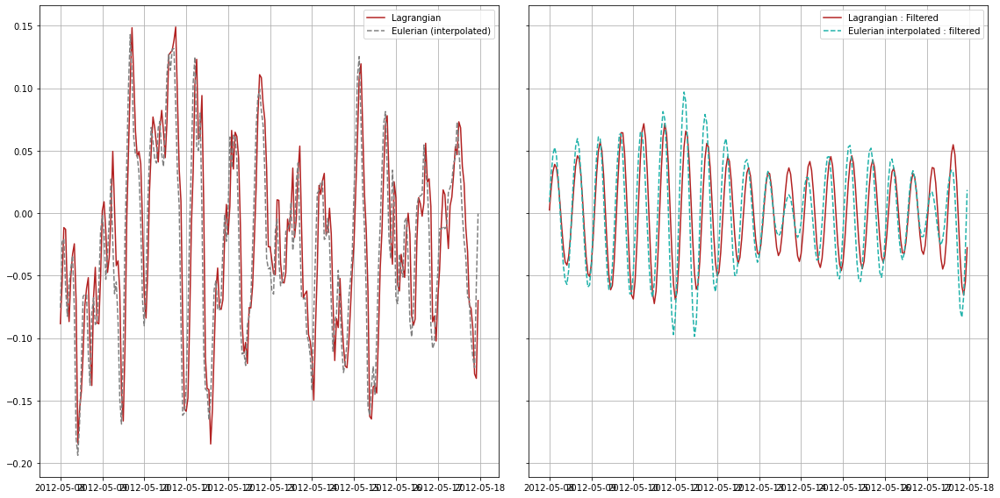

In [33]:
time = _df2.index.values
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df2_2[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp2_2[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df2_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp2_2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df2_2[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp2_2[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df2_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp2_2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

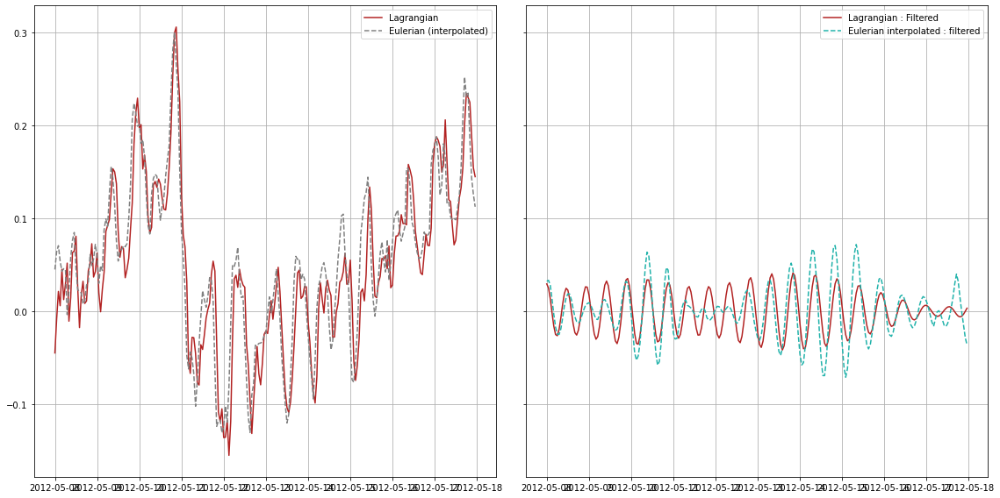

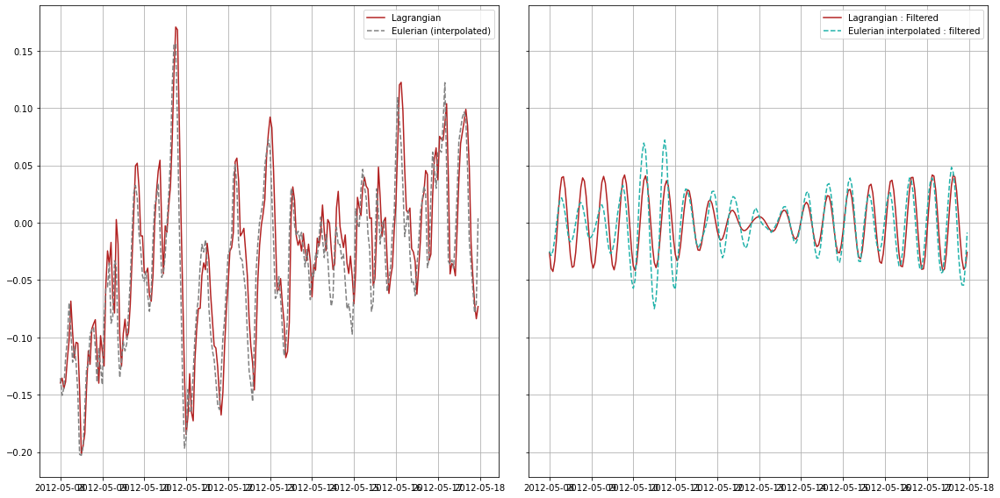

In [31]:
time = _df1.index.values
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df1[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df1[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

Text(0.5, 0.98, 'Imaginary part')

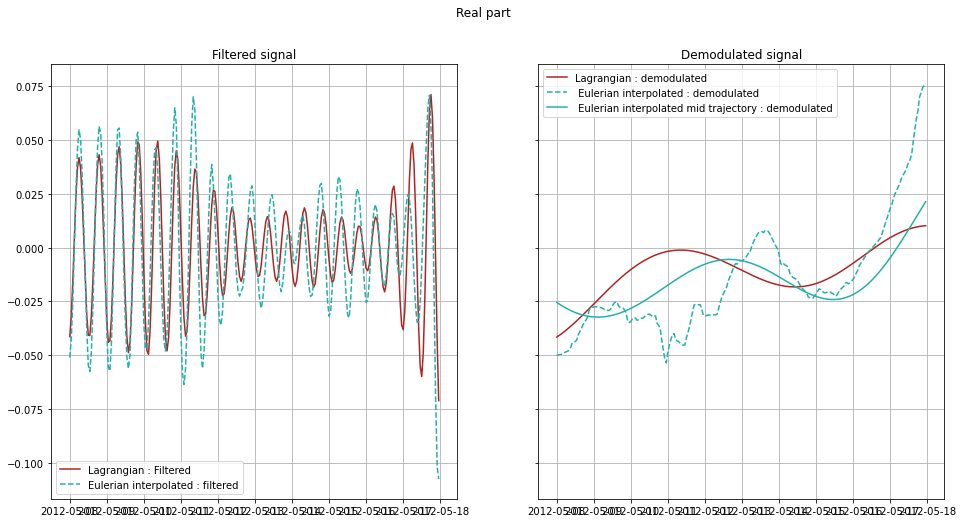

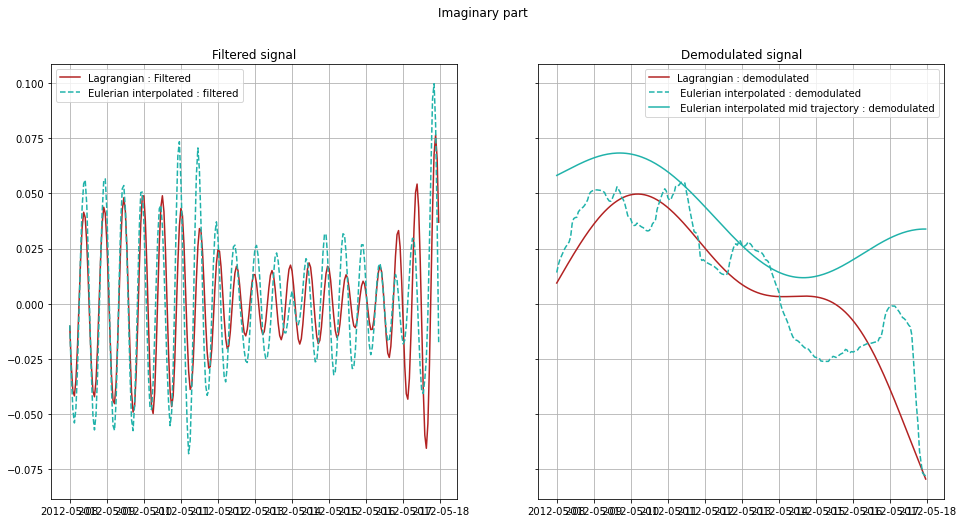

In [34]:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.imag(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2[v+'_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

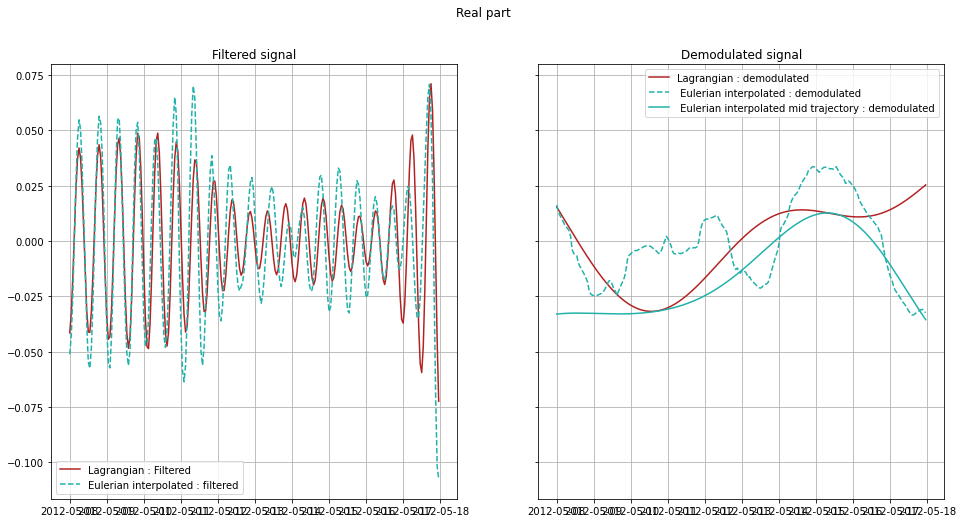

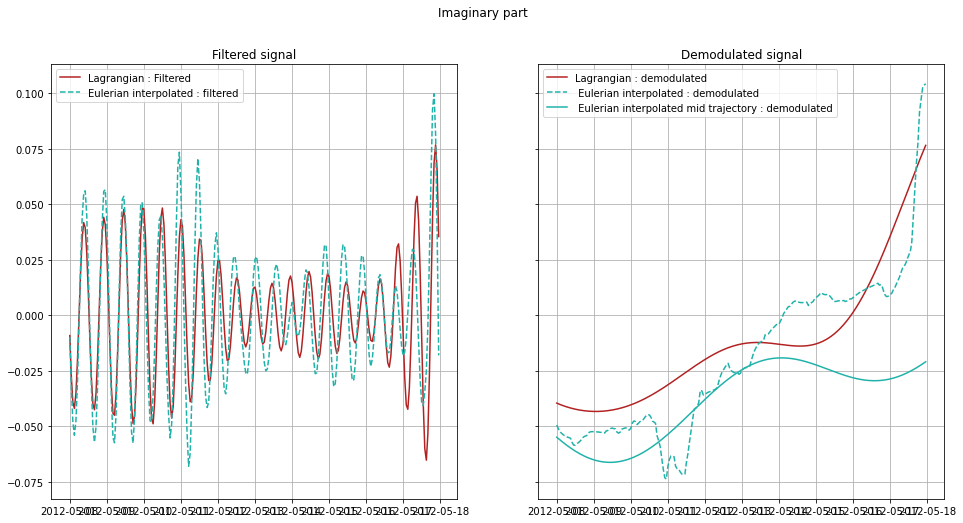

In [35]:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df2_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df2_2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2_2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2_2[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2_2[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.imag(_df2_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df2_2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2_2[v+'_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2_2[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2_2[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

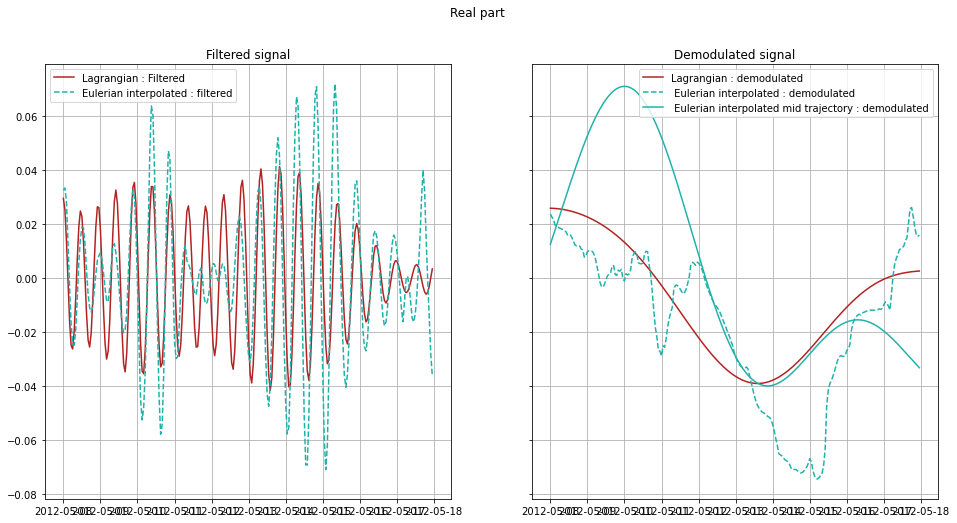

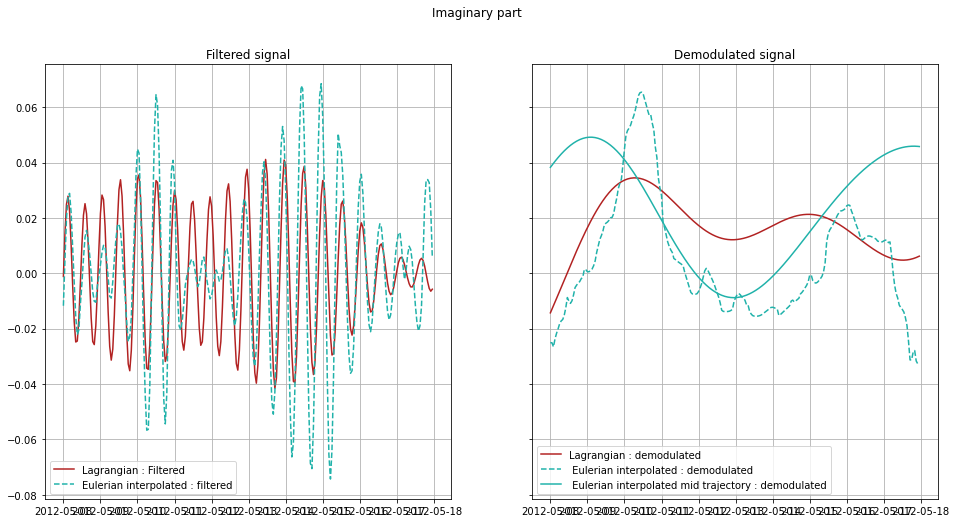

In [36]:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df1[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.imag(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df1[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp[v+'_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

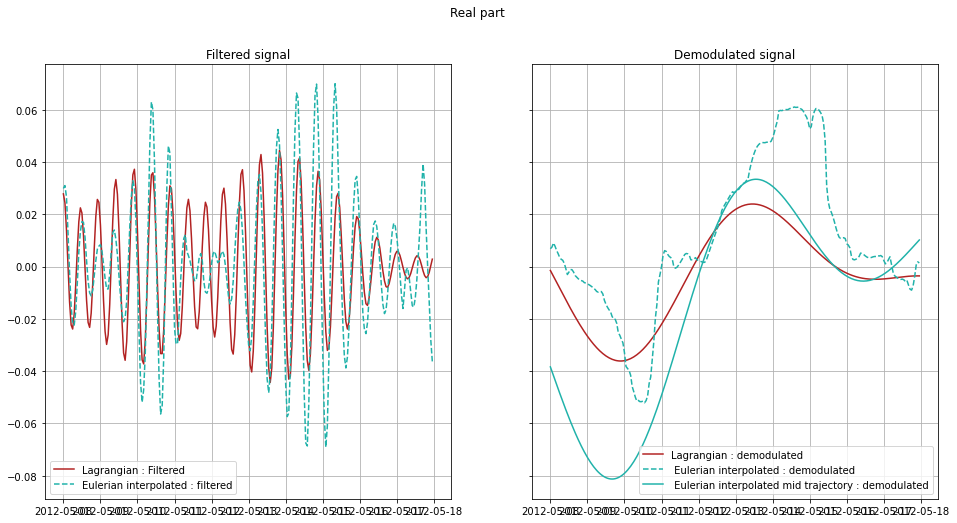

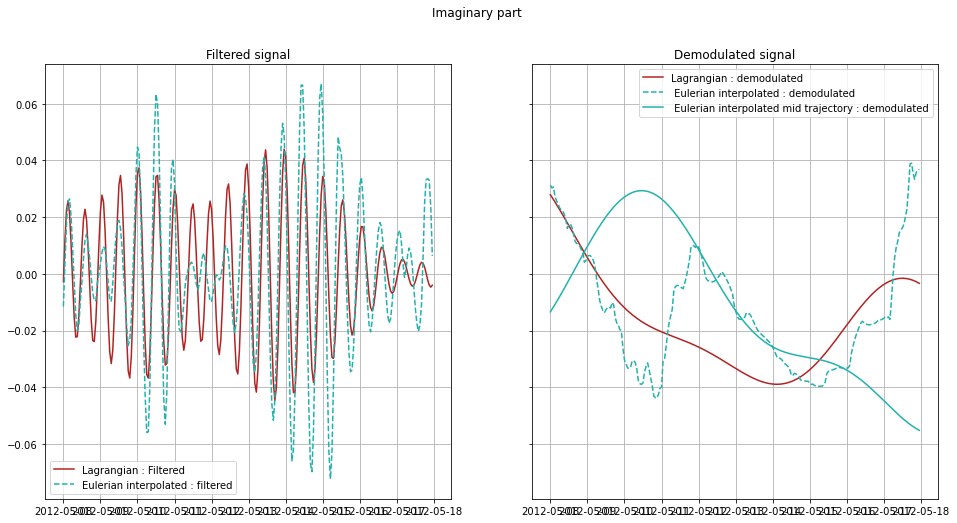

In [37]:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df1_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df1_2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_2[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_2[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.imag(_df1_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df1_2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_2[v+'_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_2[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_2[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

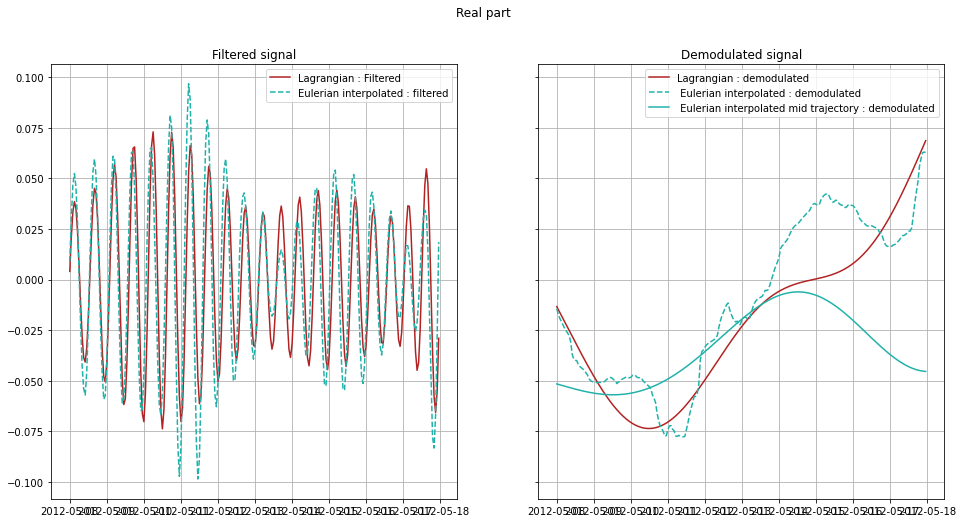

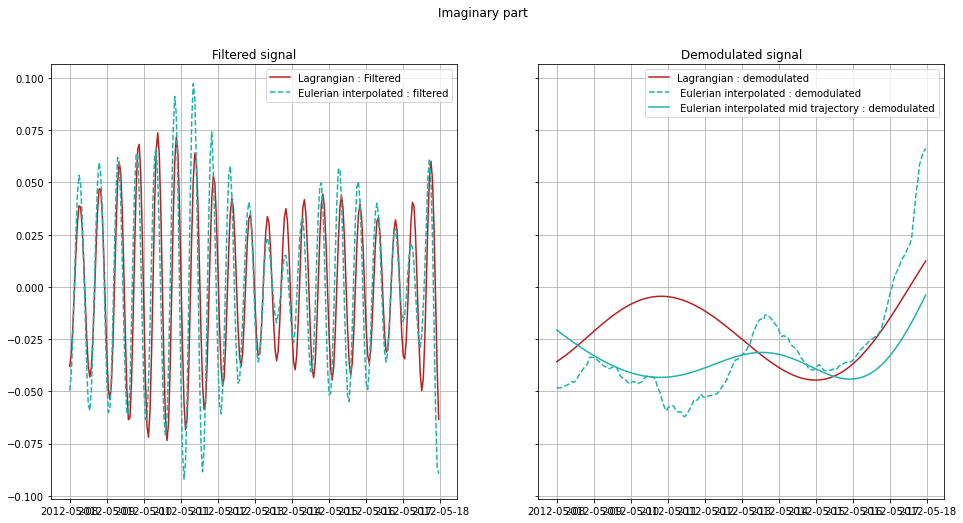

In [36]:
v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.imag(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2[v+'_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

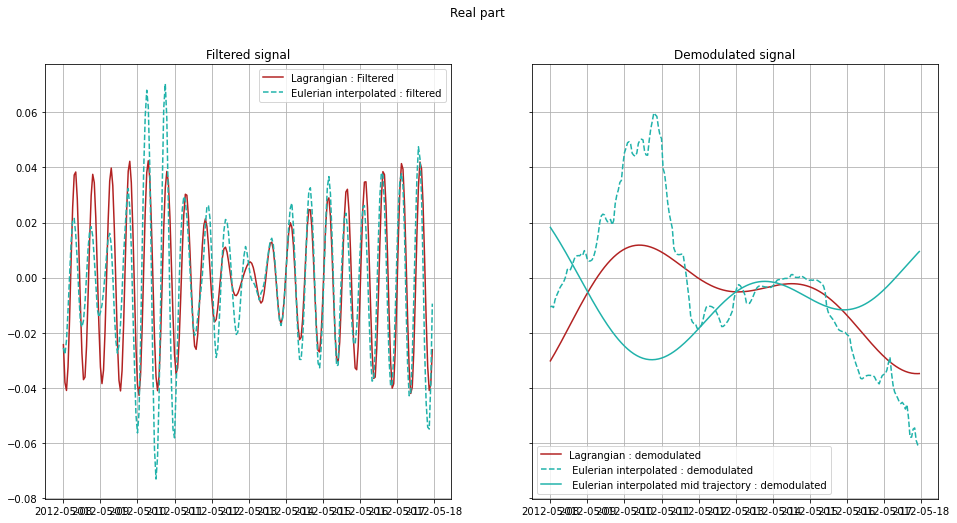

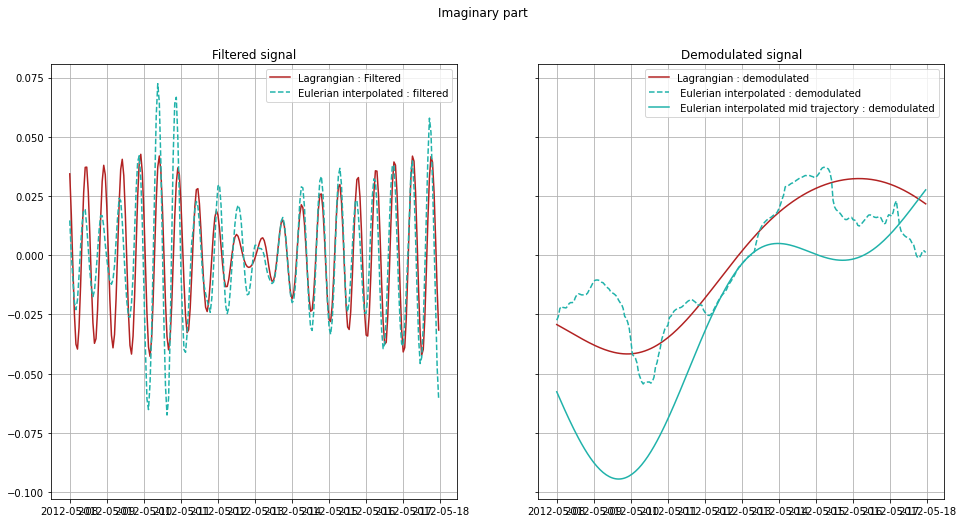

In [40]:
v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df1_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df1_2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_2[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_2[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.imag(_df1_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df1_2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_2[v+'_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_2[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_2[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

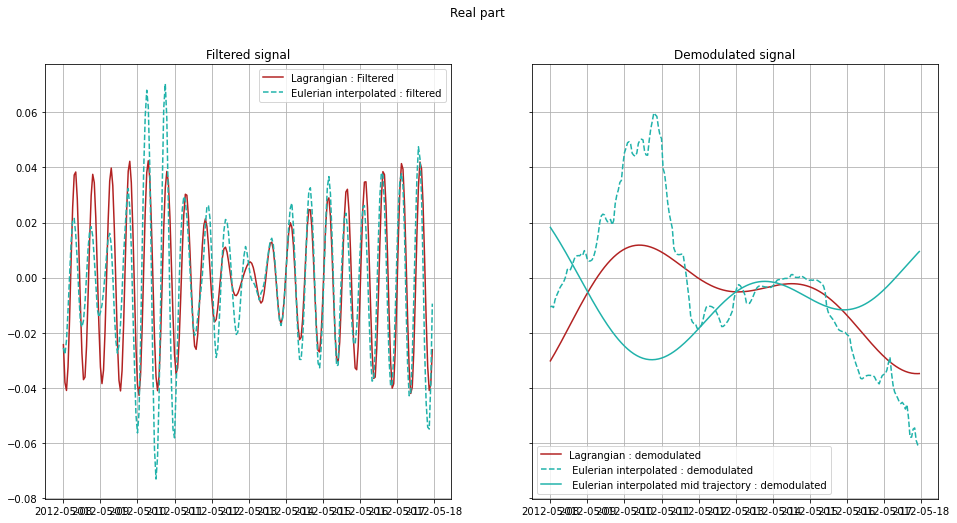

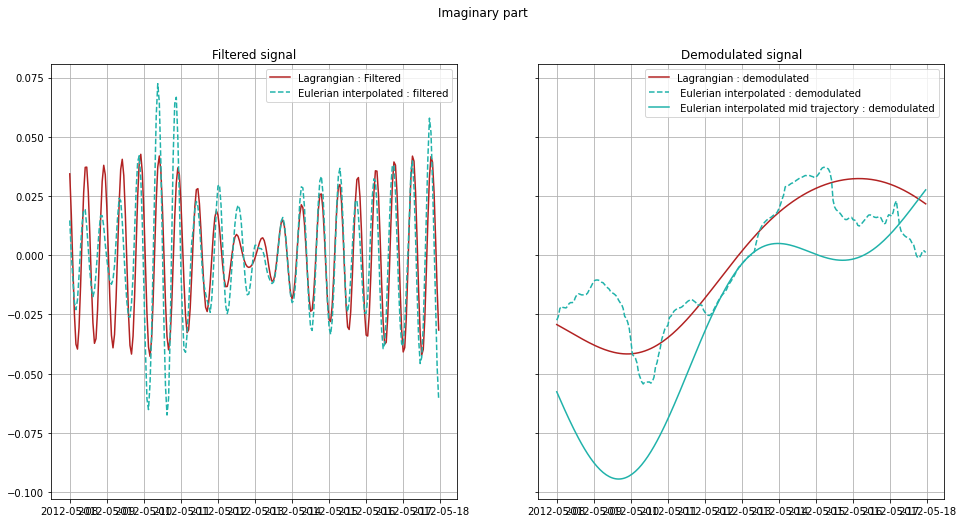

In [39]:
v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df1_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df1_2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_2[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_2[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_2[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.imag(_df1_2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df1_2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_2[v+'_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_2[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_2[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

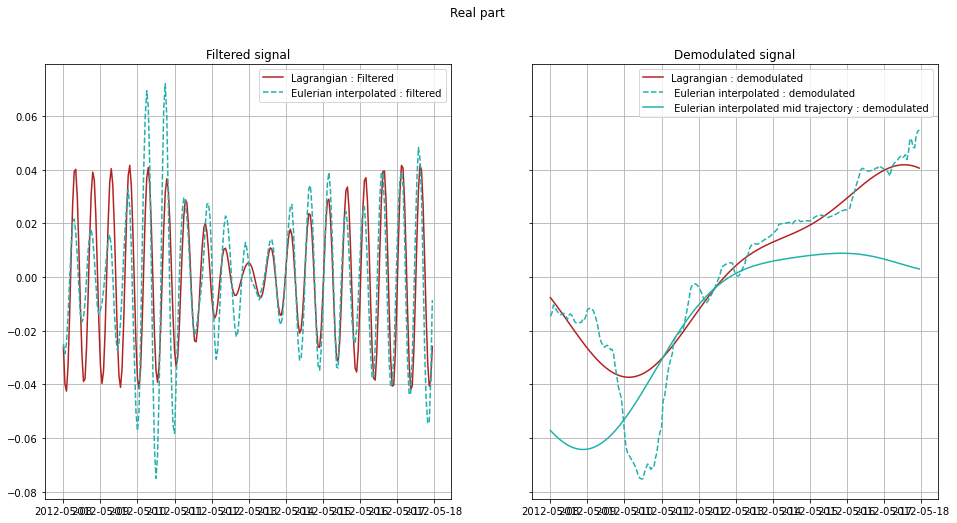

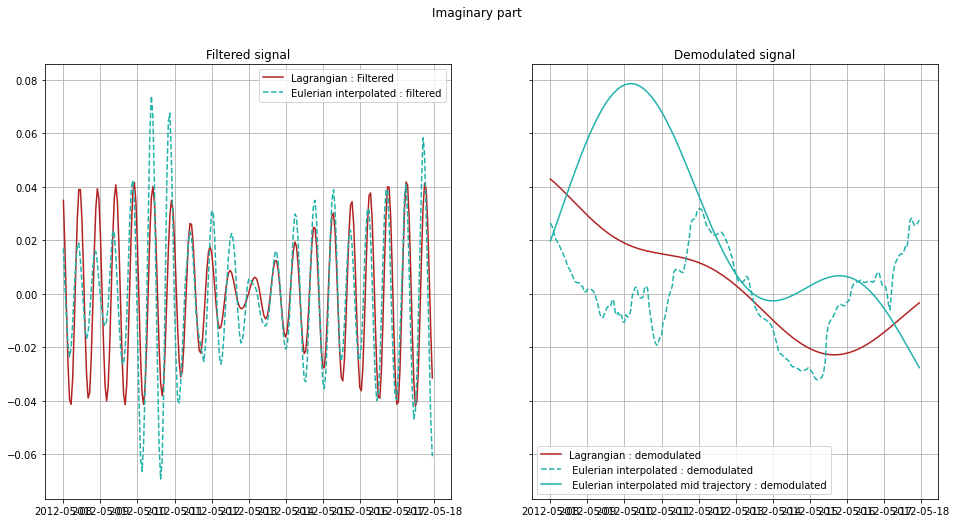

In [37]:
v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df1[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.imag(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df1[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp[v+'_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'meridional_velocity')

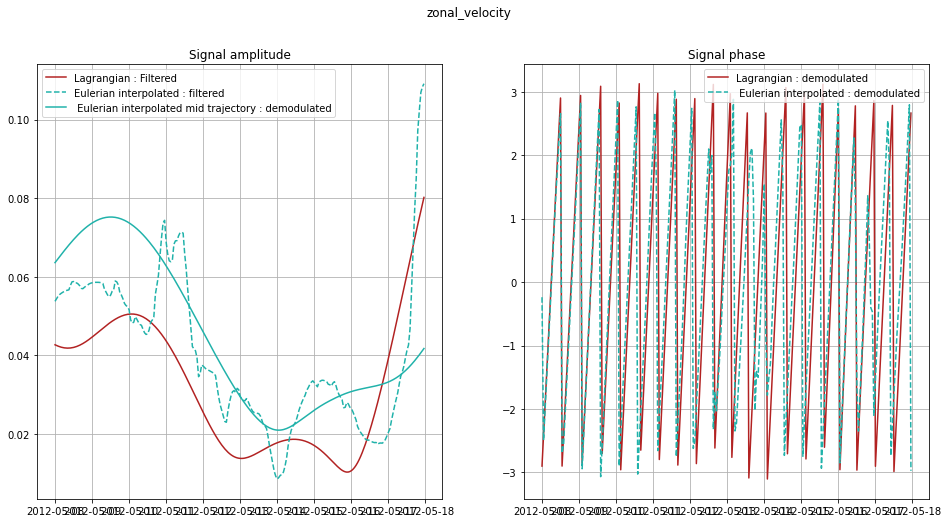

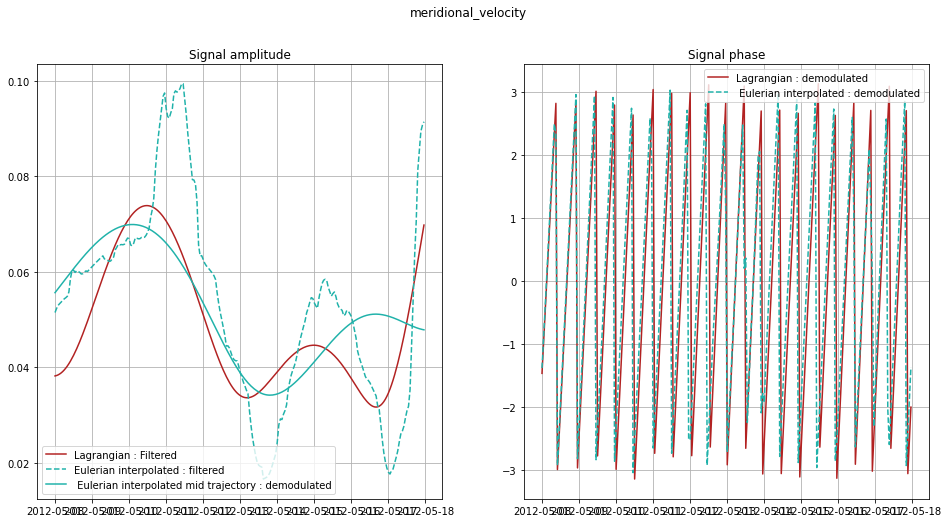

In [62]:
# amplitude and phase of filtered signal:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=False)

#ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[0].plot(time,np.abs(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.angle(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2[v+'_hat_abs'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2[v+'_hat_angle'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[0].plot(time,interp_mid2[v+'_hat_abs'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Signal amplitude');ax[1].set_title('Signal phase');
fig.suptitle(v)

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=False)

#ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[0].plot(time,np.abs(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.angle(_df2[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2[v+'_hat_abs'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2[v+'_hat_angle'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[0].plot(time,interp_mid2[v+'_hat_abs'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Signal amplitude');ax[1].set_title('Signal phase');
fig.suptitle(v)

Text(0.5, 0.98, 'meridional_velocity')

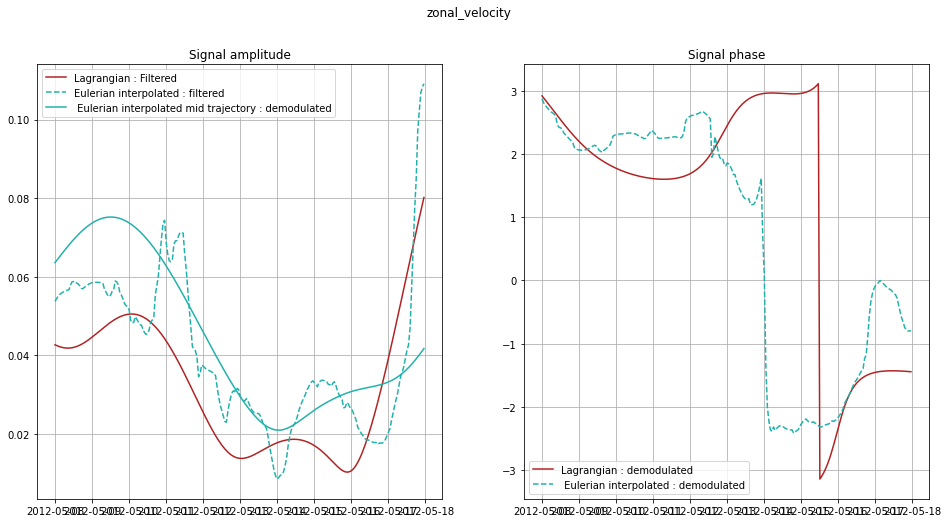

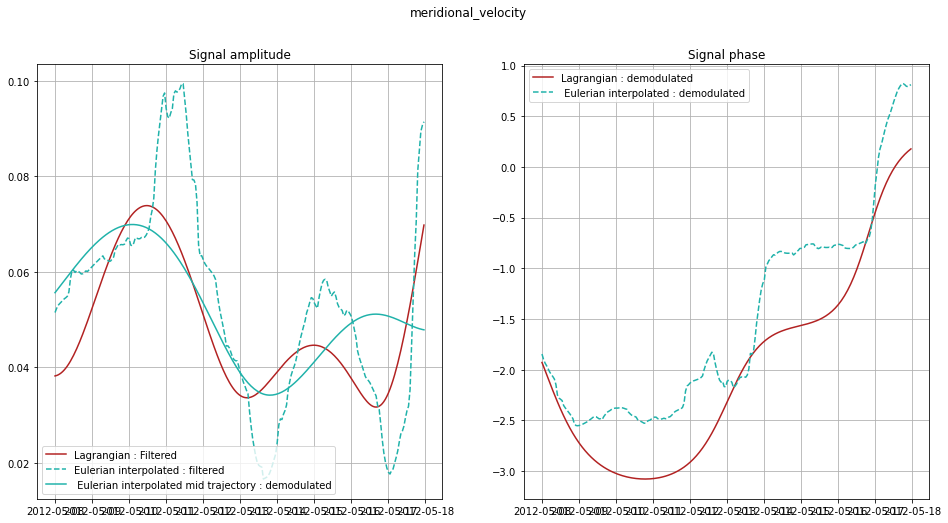

In [26]:
# amplitude and phase of filtered signal:
time = _df2.index.values

v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=False)

#ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[0].plot(time,np.abs(_df2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.angle(_df2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2[v+'_demodulated_abs'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2[v+'_demodulated_angle'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[0].plot(time,interp_mid2[v+'_demodulated_abs'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Signal amplitude');ax[1].set_title('Signal phase');
fig.suptitle(v)

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=False)

#ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[0].plot(time,np.abs(_df2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.angle(_df2[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2[v+'_demodulated_abs'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2[v+'_demodulated_angle'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[0].plot(time,interp_mid2[v+'_demodulated_abs'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Signal amplitude');ax[1].set_title('Signal phase');
fig.suptitle(v)

Text(0.5, 0.98, 'meridional_velocity')

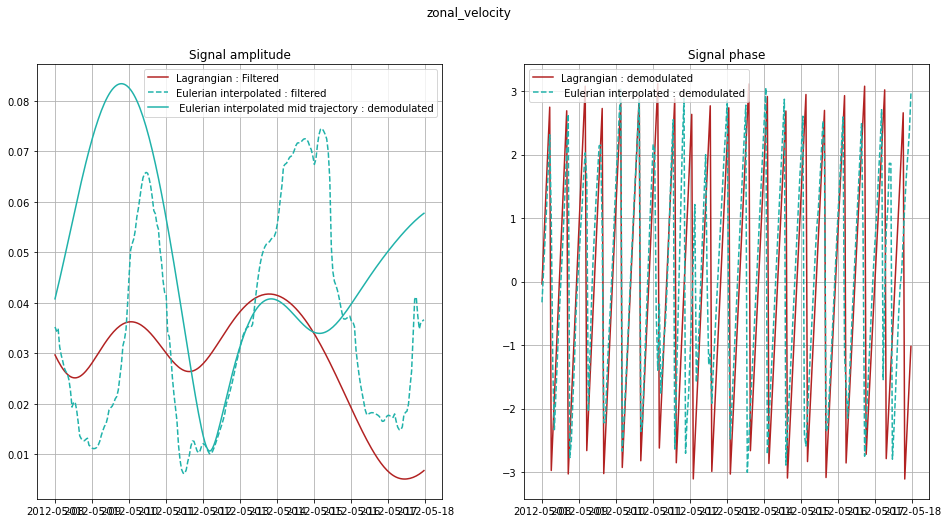

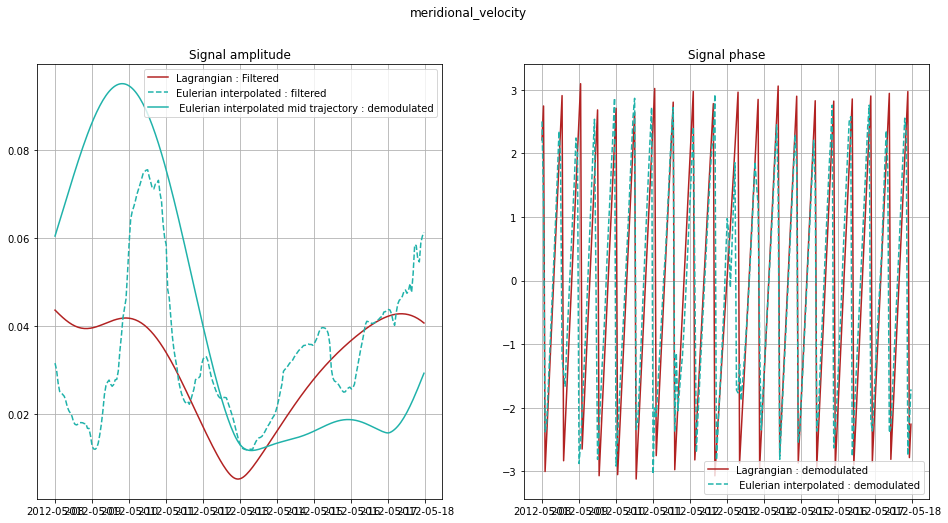

In [61]:
# amplitude and phase of filtered signal:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=False)

#ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[0].plot(time,np.abs(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.angle(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp[v+'_hat_abs'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp[v+'_hat_angle'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[0].plot(time,interp_mid[v+'_hat_abs'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Signal amplitude');ax[1].set_title('Signal phase');
fig.suptitle(v)

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=False)

#ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[0].plot(time,np.abs(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.angle(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp[v+'_hat_abs'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp[v+'_hat_angle'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[0].plot(time,interp_mid[v+'_hat_abs'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Signal amplitude');ax[1].set_title('Signal phase');
fig.suptitle(v)

Text(0.5, 0.98, 'meridional_velocity')

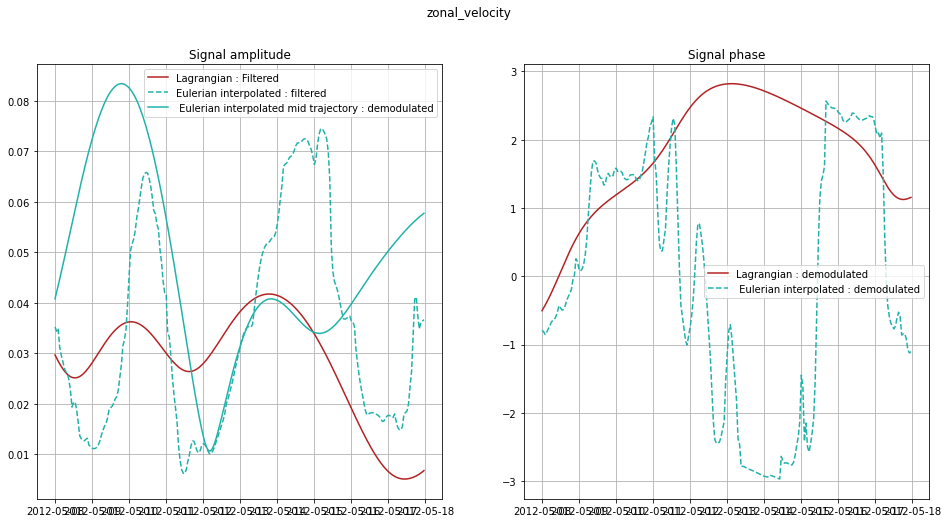

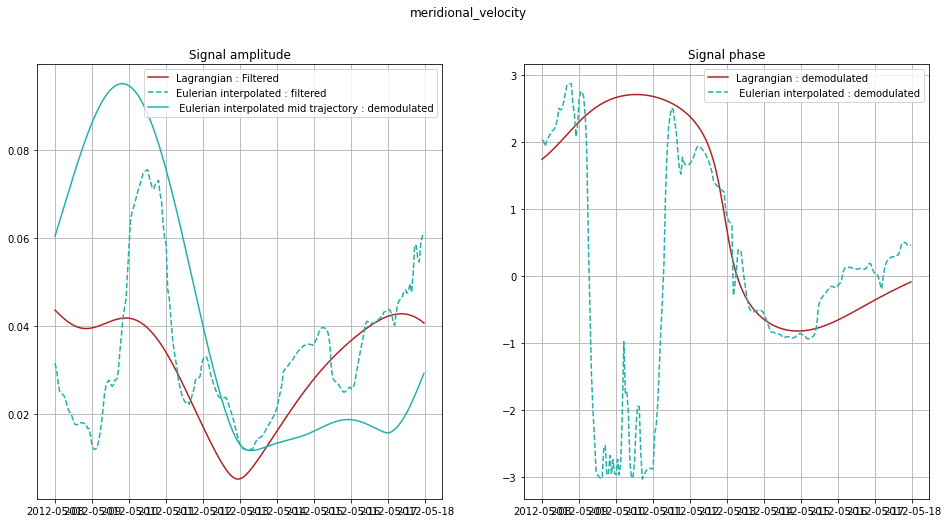

In [27]:
# amplitude and phase of filtered signal:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=False)

#ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[0].plot(time,np.abs(_df1[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.angle(_df1[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp[v+'_demodulated_abs'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp[v+'_demodulated_angle'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[0].plot(time,interp_mid[v+'_demodulated_abs'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Signal amplitude');ax[1].set_title('Signal phase');
fig.suptitle(v)

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=False)

#ax[0].plot(time,np.real(_df1[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[0].plot(time,np.abs(_df1[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.angle(_df1[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp[v+'_demodulated_abs'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp[v+'_demodulated_angle'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[0].plot(time,interp_mid[v+'_demodulated_abs'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Signal amplitude');ax[1].set_title('Signal phase');
fig.suptitle(v)

#### Near-inertial band

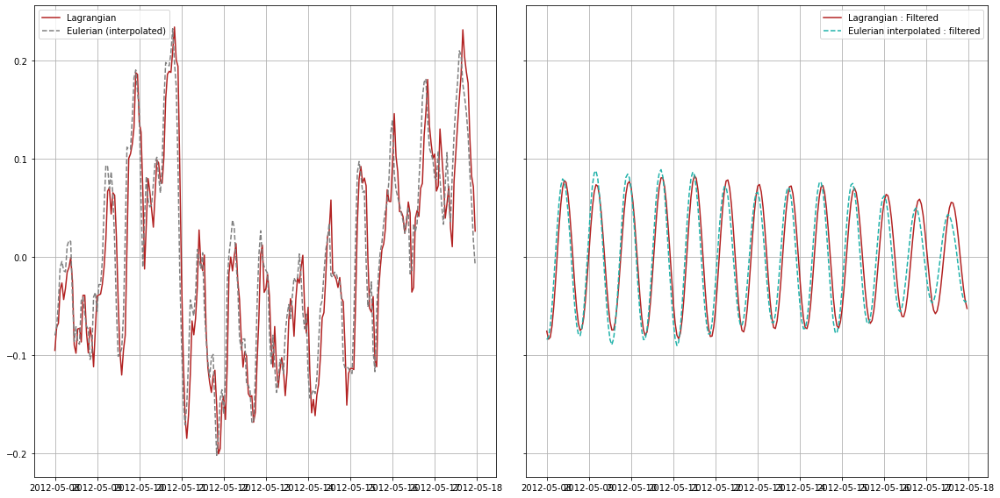

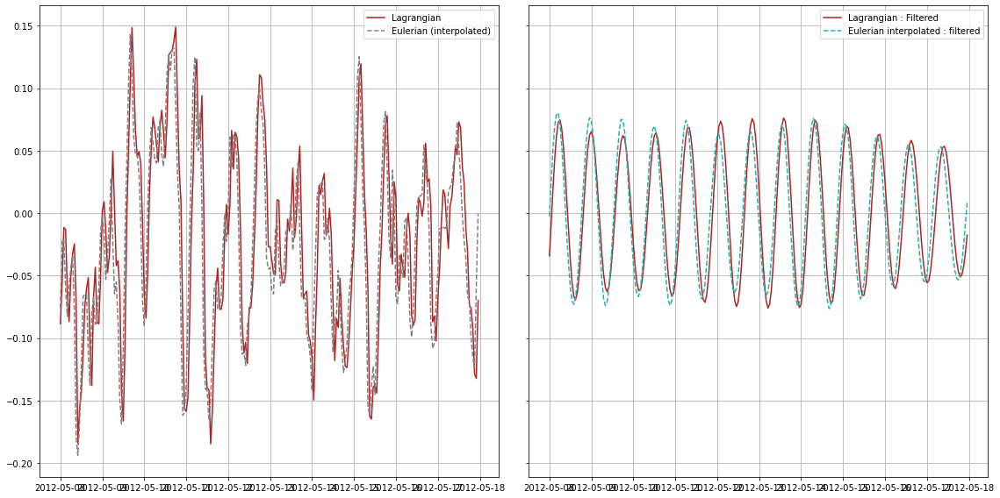

In [40]:
time = _df2.index.values
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df2_f[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp2[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df2_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp2_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df2_f[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp2[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df2_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp2_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

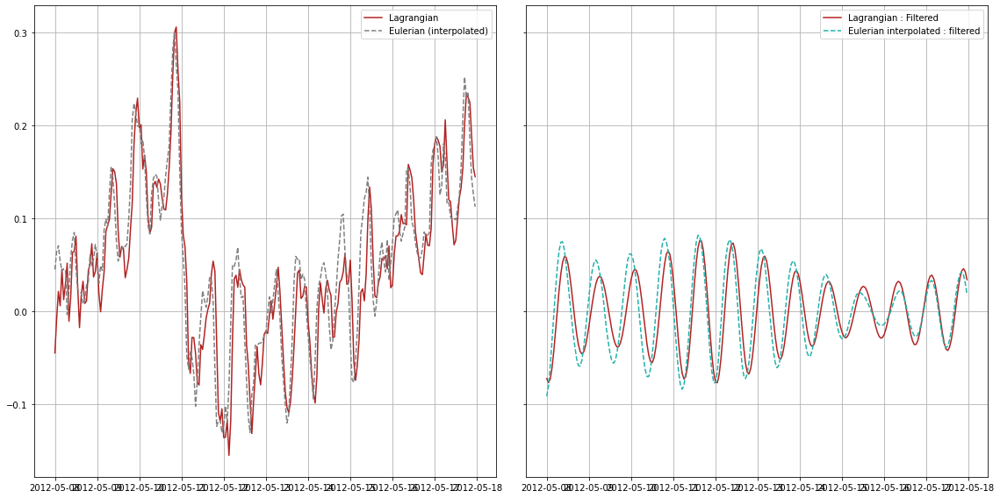

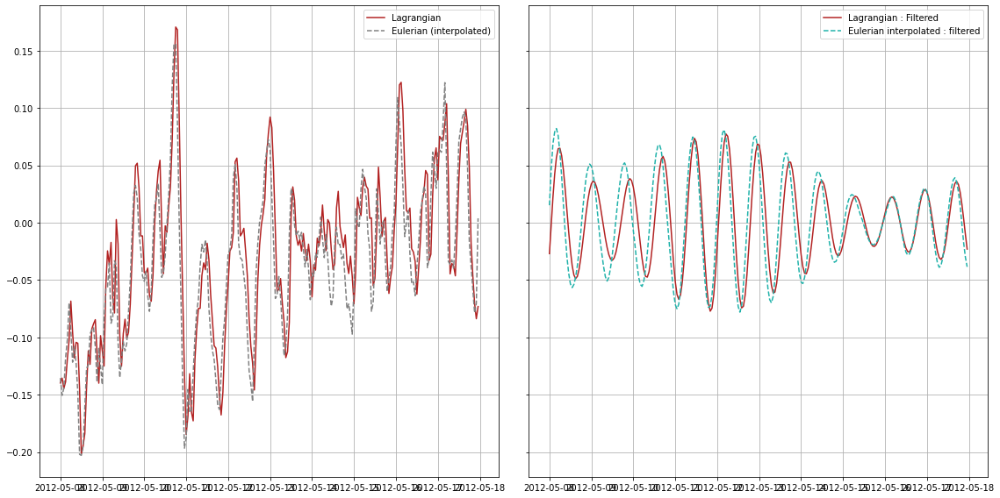

In [45]:
time = _df1.index.values
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df1_f[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df1_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)
ax[0].plot(time,_df1_f[v],c='firebrick',linestyle='-',label='Lagrangian')
ax[0].plot(time,interp[v],c='grey',linestyle='--',label='Eulerian (interpolated)')

ax[1].plot(time,np.real(_df1_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,interp_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[0].legend();ax[0].grid()
#ax[0].axvline(time[time.size//2],c='k',linestyle='--',linewidth=1)
ax[1].legend();ax[1].grid()
fig.tight_layout()

Text(0.5, 0.98, 'Imaginary part')

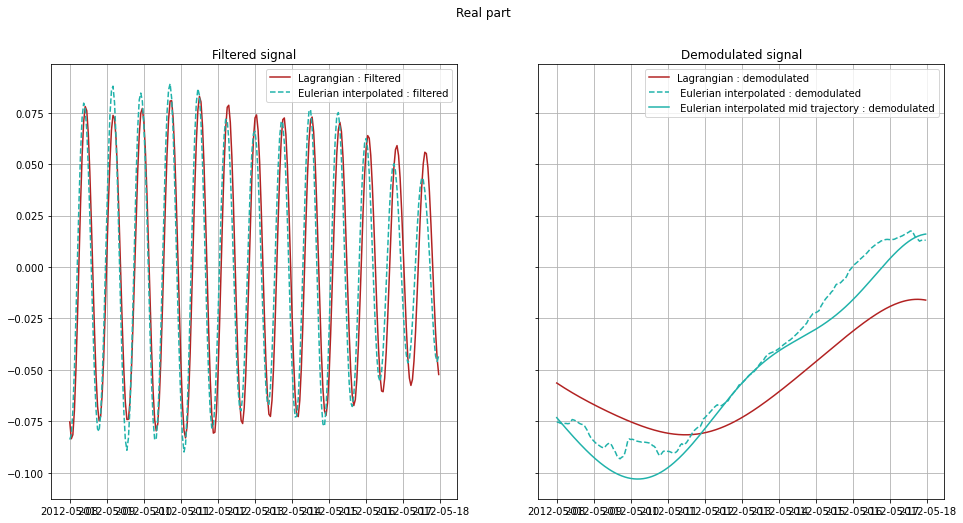

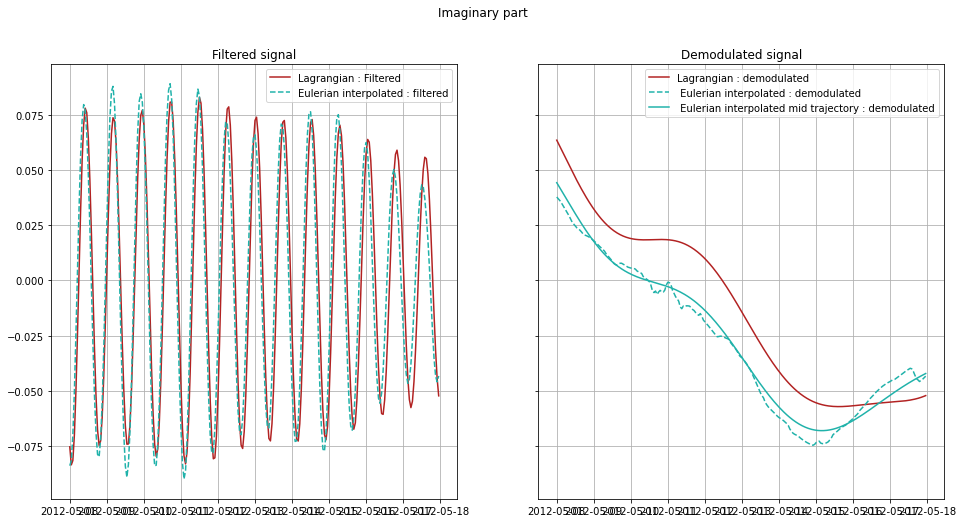

In [41]:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df2_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df2_f[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2_f[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2_f[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df2_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df2_f[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2_f[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2_f[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

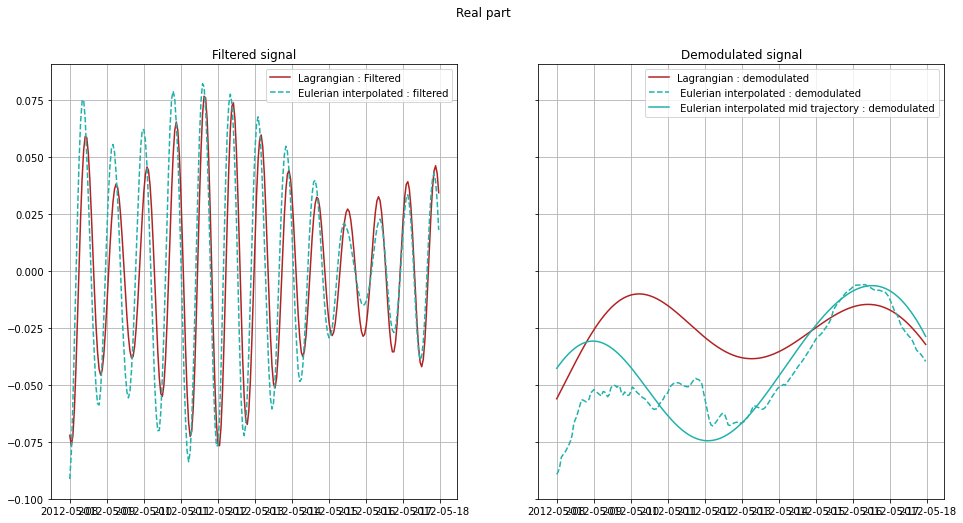

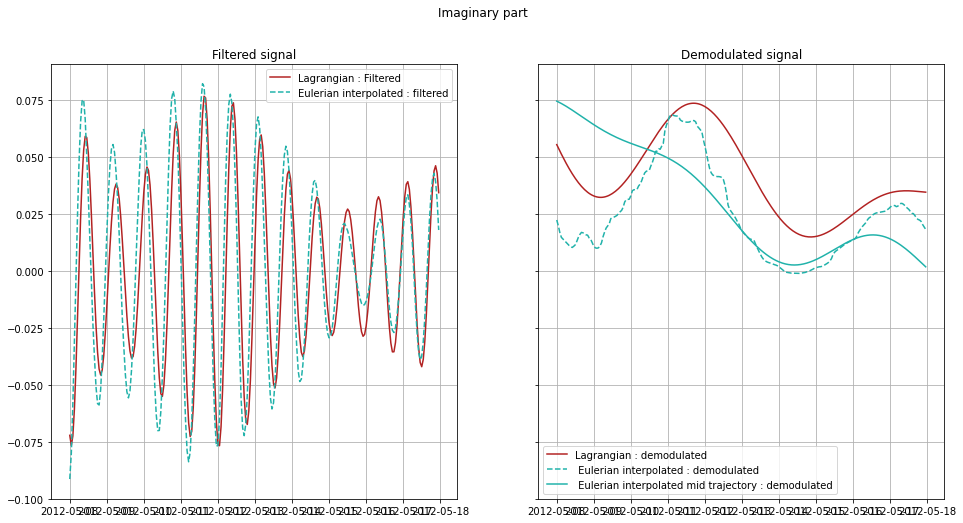

In [44]:
v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df1_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df1_f[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_f[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_f[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'zonal_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df1_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df1_f[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_f[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_f[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

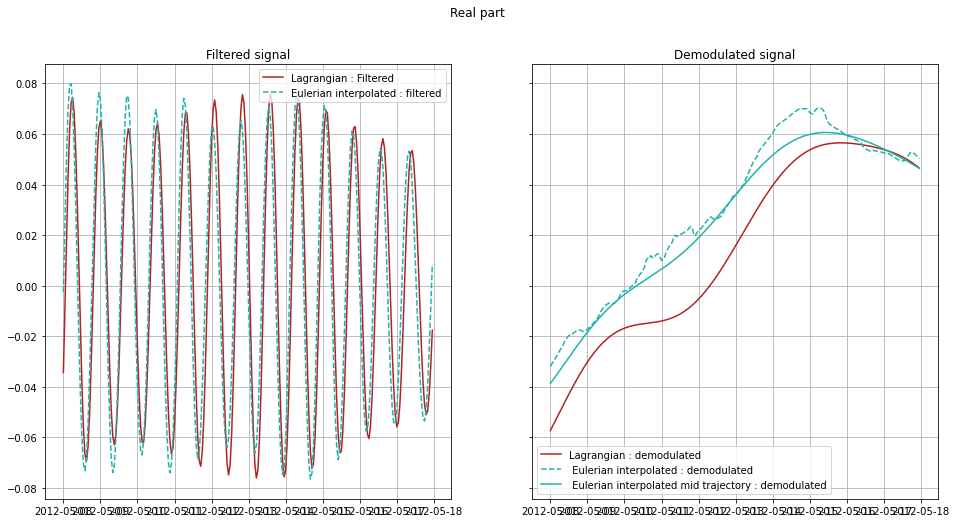

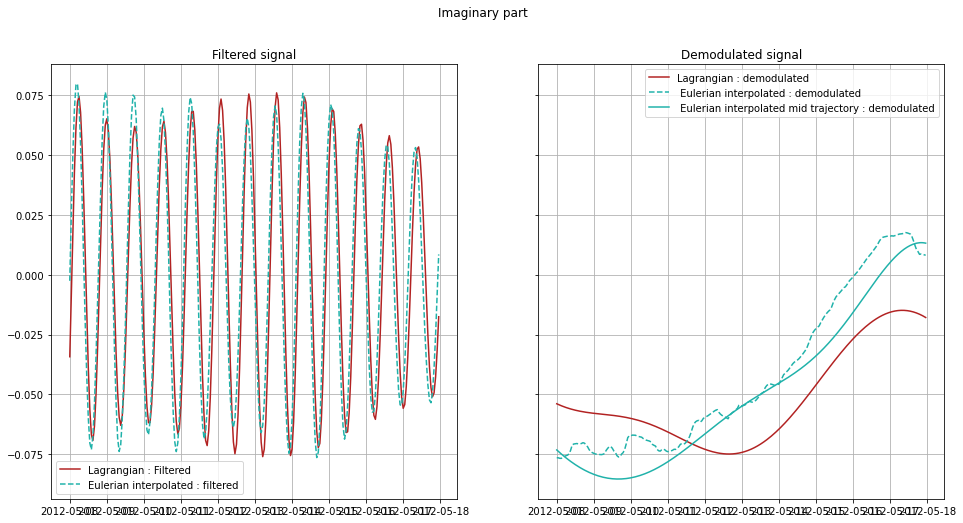

In [42]:
v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df2_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df2_f[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2_f[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2_f[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df2_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df2_f[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp2_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp2_f[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid2_f[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

Text(0.5, 0.98, 'Imaginary part')

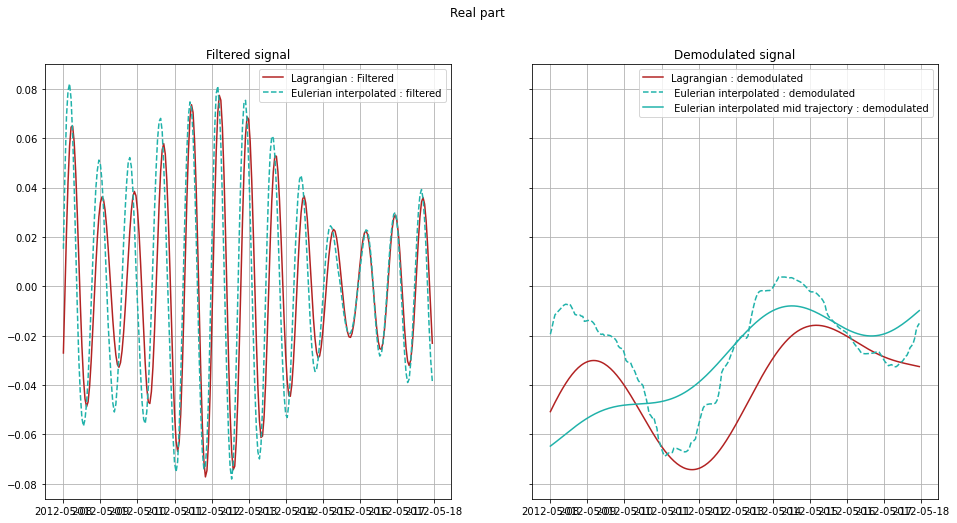

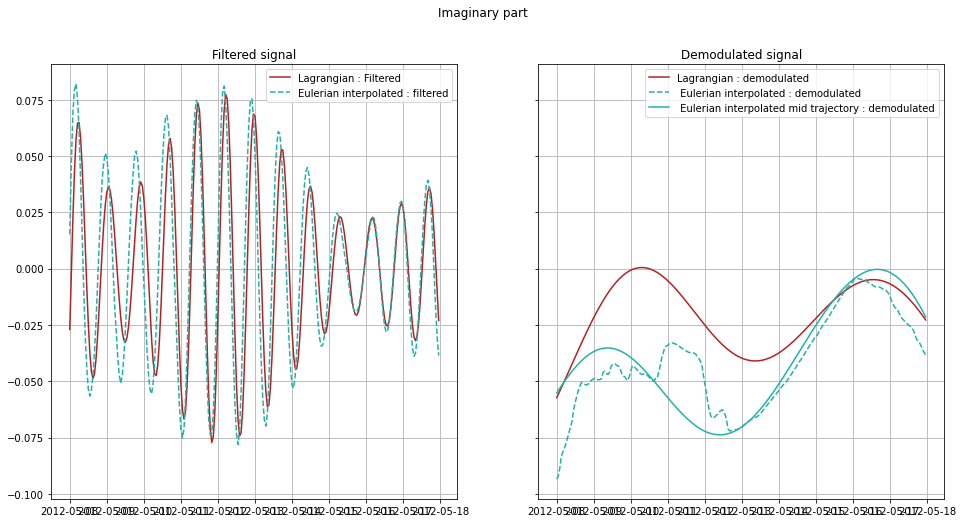

In [43]:
v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df1_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.real(_df1_f[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_f[v+'_demodulated_real'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_f[v+'_demodulated_real'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Real part')

v = 'meridional_velocity'
fig,ax = plt.subplots(1,2,figsize=(16,8),sharey=True)

ax[0].plot(time,np.real(_df1_f[v+'_hat']),c='firebrick',linestyle='-',label='Lagrangian : Filtered')
ax[1].plot(time,np.imag(_df1_f[v+'_demodulated']),c='firebrick',linestyle='-',label='Lagrangian : demodulated')

ax[0].plot(time,interp_f[v+'_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : filtered')
ax[1].plot(time,interp_f[v+'_demodulated_imag'],c='lightseagreen',linestyle='--',label=' Eulerian interpolated : demodulated')
ax[1].plot(time,interp_mid_f[v+'_demodulated_imag'],c='lightseagreen',linestyle='-',label=' Eulerian interpolated mid trajectory : demodulated')

ax[0].legend();ax[0].grid()
ax[1].legend();ax[1].grid()
ax[0].set_title('Filtered signal');ax[1].set_title('Demodulated signal');
fig.suptitle('Imaginary part')

In [29]:
dt = 1. # in hours
T = 20
omega_low = 1/30
h_low = signal.firwin(T*24, cutoff=[omega_low], pass_zero=True, nyq=1./2/dt, scale=True)

#ax = plt.subplot(111)
#ax.plot(np.arange(0,T,dt/24),h)
#x.grid()

In [30]:
V = ['zonal_velocity','meridional_velocity']
ds_hat_low = xr.merge([filt(dsp[v], h_low,hilbert=False).rename(v+'_hat') for v in V]).persist()

In [31]:
df_filtered_low = df_selected.groupby('trajectory').apply(filt_L,h_low,['zonal_velocity','meridional_velocity'],omega_low,hilbert=False).persist()
#df_filtered = df_filtered.repartition(npartitions=10).persist()

df_filtered_low = df_filtered_low.drop(columns='trajectory').reset_index().sort_values('time').set_index('time').persist()

<ipython-input-31-a4cf8e7a00d1>:1: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  df_filtered_low = df_selected.groupby('trajectory').apply(filt_L,h_low,['zonal_velocity','meridional_velocity'],omega_low,hilbert=False).persist()


In [41]:
dsi_low = ds_hat_low.isel(time=slice(int(t_mid-dtime),int(t_mid+dtime)))
_df1_low = df_filtered_low.loc[dsi_low.time.values][df_filtered_low.loc[dsi_low.time.values].trajectory==37000174].compute()
_df2_low = df_filtered_low.loc[dsi_low.time.values][df_filtered_low.loc[dsi_low.time.values].trajectory==38000248].compute()

In [42]:
v = 'zonal_velocity_hat'
interp_hat_low,interp_mid_hat_low = interp_sig(_df1_low,dsi_low,v,_df1_low.index.values,part='real')
interp2_hat_low,interp_mid2_hat_low = interp_sig(_df2_low,dsi_low,v,_df2_low.index.values,part='real')

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/numpy/core/_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


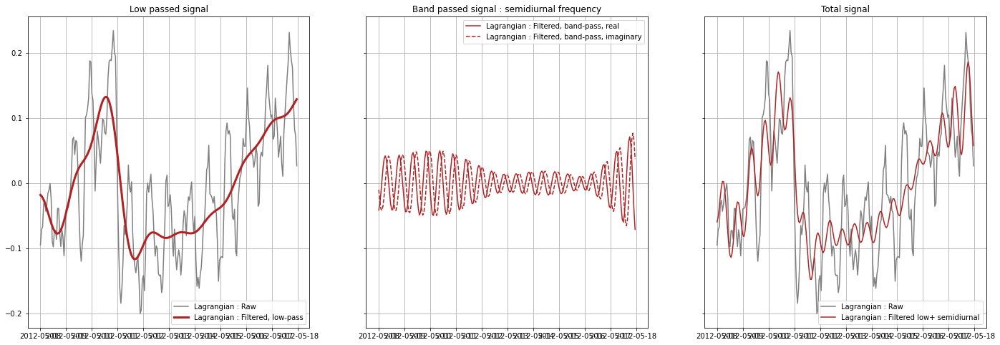

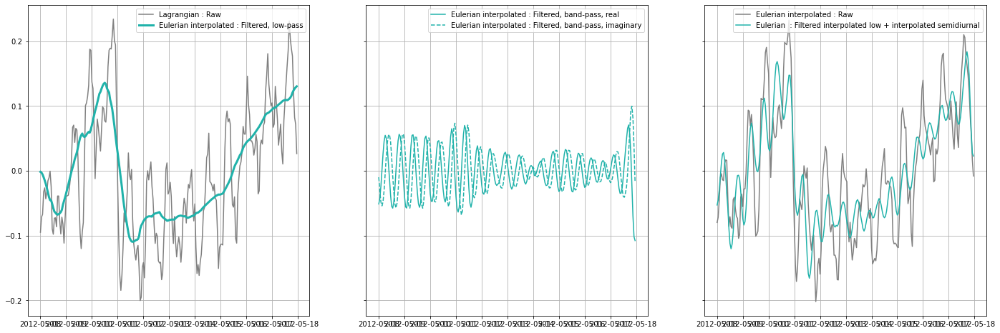

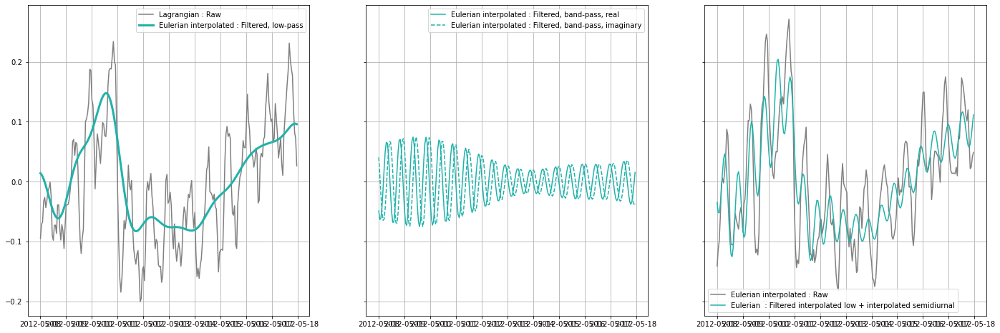

In [47]:
fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[0].plot(time,_df2_low.zonal_velocity_hat,c='firebrick',linestyle='-',label='Lagrangian : Filtered, low-pass',linewidth=3)


ax[1].plot(time,np.real(_df2.zonal_velocity_hat),c='firebrick',linestyle='-',label='Lagrangian : Filtered, band-pass, real')
ax[1].plot(time,np.imag(_df2.zonal_velocity_hat),c='firebrick',linestyle='--',label='Lagrangian : Filtered, band-pass, imaginary')
ax[2].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[2].plot(time,_df2.zonal_velocity_hat+np.real(_df2_low.zonal_velocity_hat),c='firebrick',linestyle='-',label='Lagrangian : Filtered low+ semidiurnal')
ax[0].legend();ax[0].grid();ax[2].grid()
ax[1].legend();ax[1].grid();ax[2].legend()
ax[0].set_title('Low passed signal');ax[1].set_title('Band passed signal : semidiurnal frequency')
ax[2].set_title('Total signal')
fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[0].plot(time,interp2_hat_low,c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, low-pass',linewidth=3)


ax[1].plot(time,interp2['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, band-pass, real')
ax[1].plot(time,interp2['zonal_velocity_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : Filtered, band-pass, imaginary')
ax[2].plot(time,interp2['zonal_velocity'],c='grey',linestyle='-',label='Eulerian interpolated : Raw')
ax[2].plot(time,interp2_hat_low+interp2['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian  : Filtered interpolated low + interpolated semidiurnal')
#ax[2].plot(time,interp2_hatr_low_sd,c='k',linestyle='--',label='Eulerian  interpolated : Filtered low +  semidiurnal')

ax[0].legend();ax[0].grid();ax[2].grid()
ax[1].legend();ax[1].grid();ax[2].legend()

fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[0].plot(time,interp_mid2_hat_low,c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, low-pass',linewidth=3)


ax[1].plot(time,interp_mid2['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, band-pass, real')
ax[1].plot(time,interp_mid2['zonal_velocity_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : Filtered, band-pass, imaginary')
ax[2].plot(time,interp_mid2['zonal_velocity'],c='grey',linestyle='-',label='Eulerian interpolated : Raw')
ax[2].plot(time,interp_mid2_hat_low+interp_mid2['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian  : Filtered interpolated low + interpolated semidiurnal')
#ax[2].plot(time,interp2_hatr_low_sd,c='k',linestyle='--',label='Eulerian  interpolated : Filtered low +  semidiurnal')

ax[0].legend();ax[0].grid();ax[2].grid()
ax[1].legend();ax[1].grid();ax[2].legend()

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/numpy/core/_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


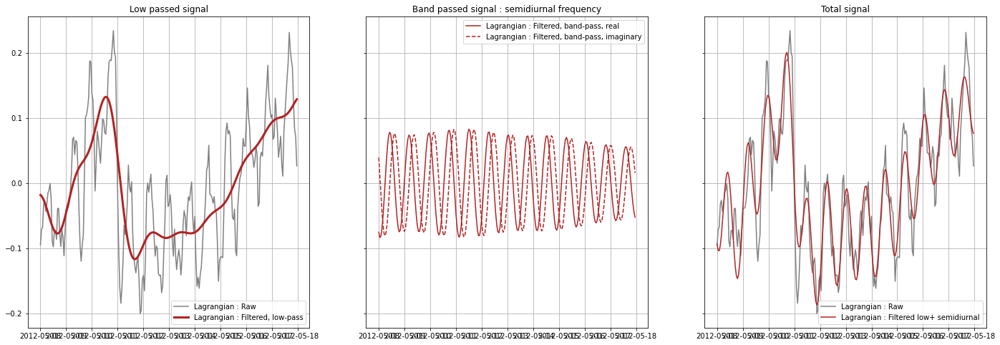

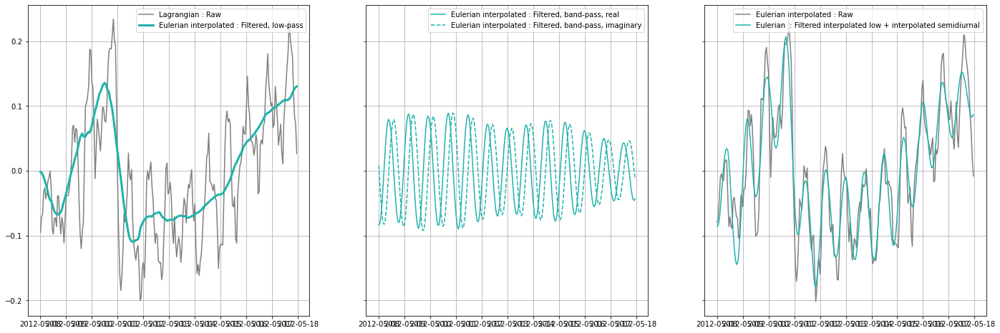

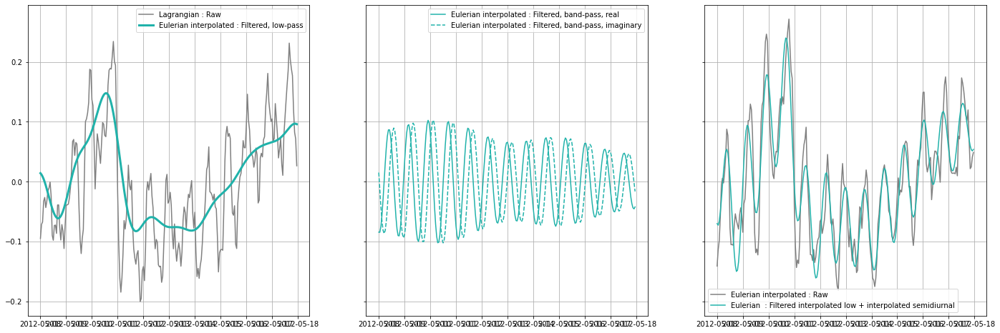

In [50]:
fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[0].plot(time,_df2_low.zonal_velocity_hat,c='firebrick',linestyle='-',label='Lagrangian : Filtered, low-pass',linewidth=3)


ax[1].plot(time,np.real(_df2_f.zonal_velocity_hat),c='firebrick',linestyle='-',label='Lagrangian : Filtered, band-pass, real')
ax[1].plot(time,np.imag(_df2_f.zonal_velocity_hat),c='firebrick',linestyle='--',label='Lagrangian : Filtered, band-pass, imaginary')
ax[2].plot(time,_df2_f.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[2].plot(time,_df2_f.zonal_velocity_hat+np.real(_df2_low.zonal_velocity_hat),c='firebrick',linestyle='-',label='Lagrangian : Filtered low+ semidiurnal')
ax[0].legend();ax[0].grid();ax[2].grid()
ax[1].legend();ax[1].grid();ax[2].legend()
ax[0].set_title('Low passed signal');ax[1].set_title('Band passed signal : semidiurnal frequency')
ax[2].set_title('Total signal')
fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[0].plot(time,interp2_hat_low,c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, low-pass',linewidth=3)


ax[1].plot(time,interp2_f['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, band-pass, real')
ax[1].plot(time,interp2_f['zonal_velocity_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : Filtered, band-pass, imaginary')
ax[2].plot(time,interp2['zonal_velocity'],c='grey',linestyle='-',label='Eulerian interpolated : Raw')
ax[2].plot(time,interp2_hat_low+interp2_f['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian  : Filtered interpolated low + interpolated semidiurnal')
#ax[2].plot(time,interp2_hatr_low_sd,c='k',linestyle='--',label='Eulerian  interpolated : Filtered low +  semidiurnal')

ax[0].legend();ax[0].grid();ax[2].grid()
ax[1].legend();ax[1].grid();ax[2].legend()

fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[0].plot(time,interp_mid2_hat_low,c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, low-pass',linewidth=3)


ax[1].plot(time,interp_mid2_f['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, band-pass, real')
ax[1].plot(time,interp_mid2_f['zonal_velocity_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : Filtered, band-pass, imaginary')
ax[2].plot(time,interp_mid2['zonal_velocity'],c='grey',linestyle='-',label='Eulerian interpolated : Raw')
ax[2].plot(time,interp_mid2_hat_low+interp_mid2_f['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian  : Filtered interpolated low + interpolated semidiurnal')
#ax[2].plot(time,interp2_hatr_low_sd,c='k',linestyle='--',label='Eulerian  interpolated : Filtered low +  semidiurnal')

ax[0].legend();ax[0].grid();ax[2].grid()
ax[1].legend();ax[1].grid();ax[2].legend()

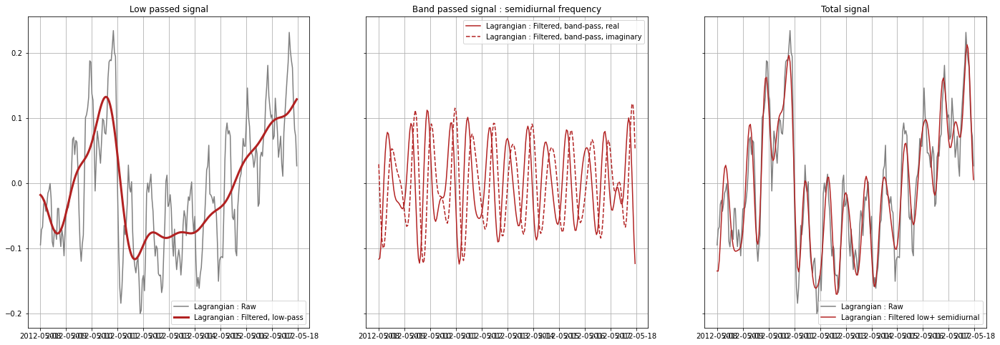

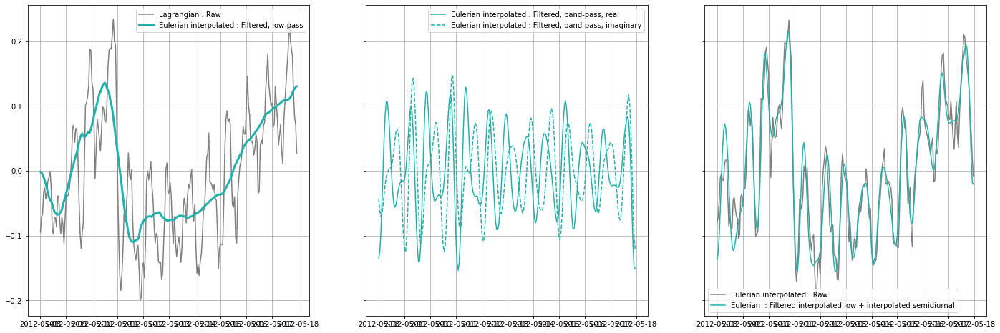

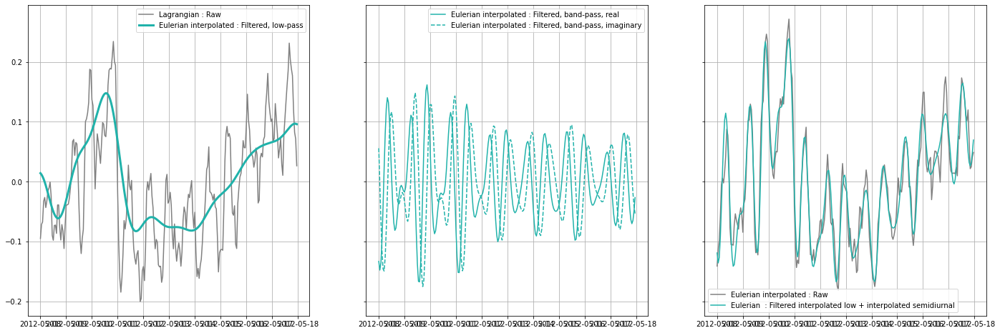

In [51]:
fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[0].plot(time,_df2_low.zonal_velocity_hat,c='firebrick',linestyle='-',label='Lagrangian : Filtered, low-pass',linewidth=3)


ax[1].plot(time,np.real(_df2_f.zonal_velocity_hat)+np.real(_df2.zonal_velocity_hat),c='firebrick',linestyle='-',label='Lagrangian : Filtered, band-pass, real')
ax[1].plot(time,np.imag(_df2_f.zonal_velocity_hat)+np.imag(_df2.zonal_velocity_hat),c='firebrick',linestyle='--',label='Lagrangian : Filtered, band-pass, imaginary')
ax[2].plot(time,_df2_f.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[2].plot(time,np.real(_df2_f.zonal_velocity_hat)+np.real(_df2.zonal_velocity_hat)+np.real(_df2_low.zonal_velocity_hat),c='firebrick',linestyle='-',label='Lagrangian : Filtered low+ semidiurnal')
ax[0].legend();ax[0].grid();ax[2].grid()
ax[1].legend();ax[1].grid();ax[2].legend()
ax[0].set_title('Low passed signal');ax[1].set_title('Band passed signal : semidiurnal frequency')
ax[2].set_title('Total signal')
fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[0].plot(time,interp2_hat_low,c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, low-pass',linewidth=3)


ax[1].plot(time,interp2_f['zonal_velocity_hat_real']+interp2['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, band-pass, real')
ax[1].plot(time,interp2_f['zonal_velocity_hat_imag']+interp2['zonal_velocity_hat_real'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : Filtered, band-pass, imaginary')
ax[2].plot(time,interp2['zonal_velocity'],c='grey',linestyle='-',label='Eulerian interpolated : Raw')
ax[2].plot(time,interp2_hat_low+interp2_f['zonal_velocity_hat_real']+interp2['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian  : Filtered interpolated low + interpolated semidiurnal')
#ax[2].plot(time,interp2_hatr_low_sd,c='k',linestyle='--',label='Eulerian  interpolated : Filtered low +  semidiurnal')

ax[0].legend();ax[0].grid();ax[2].grid()
ax[1].legend();ax[1].grid();ax[2].legend()

fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2.zonal_velocity,c='grey',linestyle='-',label='Lagrangian : Raw')
ax[0].plot(time,interp_mid2_hat_low,c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, low-pass',linewidth=3)


ax[1].plot(time,interp_mid2_f['zonal_velocity_hat_real']+interp_mid2['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian interpolated : Filtered, band-pass, real')
ax[1].plot(time,interp_mid2_f['zonal_velocity_hat_imag']+interp_mid2['zonal_velocity_hat_imag'],c='lightseagreen',linestyle='--',label='Eulerian interpolated : Filtered, band-pass, imaginary')
ax[2].plot(time,interp_mid2['zonal_velocity'],c='grey',linestyle='-',label='Eulerian interpolated : Raw')
ax[2].plot(time,interp_mid2_hat_low+interp_mid2_f['zonal_velocity_hat_real']+interp_mid2['zonal_velocity_hat_real'],c='lightseagreen',linestyle='-',label='Eulerian  : Filtered interpolated low + interpolated semidiurnal')
#ax[2].plot(time,interp2_hatr_low_sd,c='k',linestyle='--',label='Eulerian  interpolated : Filtered low +  semidiurnal')

ax[0].legend();ax[0].grid();ax[2].grid()
ax[1].legend();ax[1].grid();ax[2].legend()

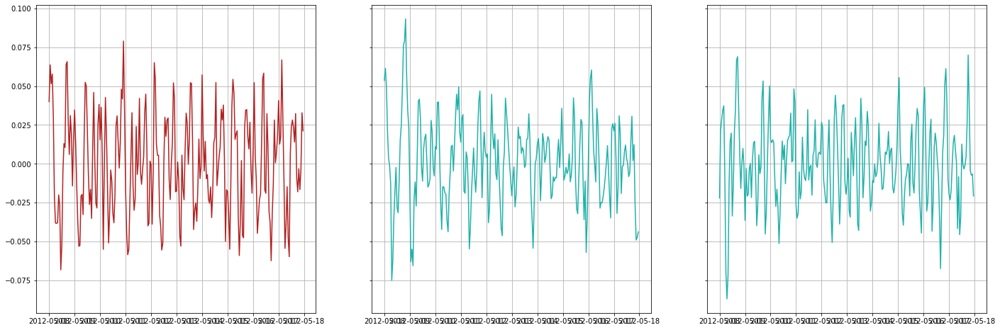

In [58]:
fig,ax = plt.subplots(1,3,figsize=(24,8),sharey=True)
ax[0].plot(time,_df2['zonal_velocity']-(_df2_low['zonal_velocity_hat']+np.real(_df2_f['zonal_velocity_hat'])+np.real(_df2['zonal_velocity_hat'])),c='firebrick',linestyle='-',label='Eulerian  : Filtered interpolated low + interpolated semidiurnal')
ax[1].plot(time,interp['zonal_velocity']-(interp_hat_low+interp_f['zonal_velocity_hat_real']+interp['zonal_velocity_hat_real']),c='lightseagreen',linestyle='-',label='Eulerian  : Filtered interpolated low + interpolated semidiurnal')
ax[2].plot(time,interp_mid2['zonal_velocity']-(interp_mid2_hat_low+interp_mid2_f['zonal_velocity_hat_real']+interp_mid2['zonal_velocity_hat_real']),c='lightseagreen',linestyle='-',label='Eulerian  : Filtered interpolated low + interpolated semidiurnal')
for a in ax:
    a.grid()


In [27]:
df_filtered = df_filtered.reset_index().persist()

In [29]:
df_filtered = df_filtered.repartition(npartitions=10).persist()



In [58]:
_dsi = ds_hat.sel(time=df_filtered.time.values.compute()[0])

In [59]:
_dsi

<xarray.Dataset>
Dimensions:                               (i: 101, j: 101)
Coordinates:
  * i                                     (i) int64 2700 2702 2704 ... 2898 2900
  * j                                     (j) int64 2900 2902 2904 ... 3098 3100
    face                                  int64 7
    time                                  datetime64[ns] 2011-11-15
    XC                                    (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    YC                                    (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    Depth                                 (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    CS                                    (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    SN                                    (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    rA                                    (j, i) float32 dask.array<chunksize=(101, 101), meta=np.ndarray>
    lon                                   (j, i) float64 dask.array<chunksize=(101, 101), meta=np.ndarray>
    lat                                   (j, i) float64 dask.array<chunksize=(101, 101), meta=np.ndarray>
Data variables:
    zonal_velocity_hat                    (j, i) complex128 dask.array<chunksize=(86, 90), meta=np.ndarray>
    zonal_velocity_demodulated            (j, i) complex128 dask.array<chunksize=(86, 90), meta=np.ndarray>
    zonal_velocity_demodulated_real       (j, i) float64 dask.array<chunksize=(86, 90), meta=np.ndarray>
    zonal_velocity_demodulated_imag       (j, i) float64 dask.array<chunksize=(86, 90), meta=np.ndarray>
    meridional_velocity_hat               (j, i) complex128 dask.array<chunksize=(86, 90), meta=np.ndarray>
    meridional_velocity_demodulated       (j, i) complex128 dask.array<chunksize=(86, 90), meta=np.ndarray>
    meridional_velocity_demodulated_real  (j, i) float64 dask.array<chunksize=(86, 90), meta=np.ndarray>
    meridional_velocity_demodulated_imag  (j, i) float64 dask.array<chunksize=(86, 90), meta=np.ndarray>
    Eta                                   (j, i) float32 dask.array<chunksize=(86, 90), meta=np.ndarray>
    zonal_velocity                        (j, i) float32 dask.array<chunksize=(86, 90), meta=np.ndarray>
    meridional_velocity                   (j, i) float32 dask.array<chunksize=(86, 90), meta=np.ndarray>

In [54]:
np.vstack((_dsi.XC.values.flatten(),_dsi.YC.values.flatten())).T

array([[-157.57292 ,   40.941288],
       [-157.57292 ,   40.9121  ],
       [-157.57292 ,   40.8829  ],
       ...,
       [-153.40625 ,   38.024445],
       [-153.40625 ,   37.9941  ],
       [-153.40625 ,   37.963737]], dtype=float32)

In [62]:
v = 'zonal_velocity_hat'
df_interp = df_filtered.groupby('time').apply(interp_trajectories,ds_hat,v,part='real').persist()
#V = ['zonal_velocity_demodulated_imag','meridional_velocity_demodulated_real','meridional_velocity_demodulated_imag']
#for v in V:
#    df_interp = df_interp.groupby(df_interp.index).apply(interp_trajectories,ds_hat,v).persist()
    #d

<ipython-input-62-6718d87f20a0>:2: UserWarning: `meta` is not specified, inferred from partial data. Please provide `meta` if the result is unexpected.
  Before: .apply(func)
  After:  .apply(func, meta={'x': 'f8', 'y': 'f8'}) for dataframe result
  or:     .apply(func, meta=('x', 'f8'))            for series result
  df_interp = df_filtered.groupby('time').apply(interp_trajectories,ds_hat,v,part='real').persist()


In [18]:
dt = 1/24
t_mid = int(360/dt//2)
dtime = int(10/dt)

In [19]:
dsi = ds_hat.isel(time=slice(int(t_mid-dtime),int(t_mid+dtime)))
_df1_func = df_interp.loc[dsi.time.values][df_interp.loc[dsi.time.values].trajectory==37000174].compute()



NameError: name 'df_interp' is not defined

In [20]:
dsi = ds_hat.isel(time=slice(int(t_mid-dtime),int(t_mid+dtime)))
_df1 = df_filtered.loc[dsi.time.values][df_filtered.loc[dsi.time.values].trajectory==37000174].compute()
_df2 = df_filtered.loc[dsi.time.values][df_filtered.loc[dsi.time.values].trajectory==38000248].compute()

#_df1_func = df_interp.loc[dsi.time.values][df_interp.loc[dsi.time.values].trajectory==37000174].compute()
#_df2_func = df_interp.loc[dsi.time.values][df_interp.loc[dsi.time.values].trajectory==38000248].compute()
#_df3 = df_filtered.loc[dsi.time.values][df_filtered.loc[dsi.time.values].trajectory==38001401].compute()
#_df4 = df_filtered.loc[dsi.time.values][df_filtered.loc[dsi.time.values].trajectory==38000024].compute()
#_df5 = df_filtered.loc[dsi.time.values][df_filtered.loc[dsi.time.values].trajectory==38000172].compute()
#_df6 = df_filtered.loc[dsi.time.values][df_filtered.loc[dsi.time.values].trajectory==38000097].compute()

In [21]:
def interp_trajectories(df_sub,ds,v,part=None):
    """
    Interpolate Eulerian mean field over simulated drifters trajectories usin inverse distance weigthing method.
    
    Parameters:
    ----------
    df_sub : dask dataframe
    v : Variable to be interpolated
    Returns:
    ----------
    df_sub : input dask dataframe with an additional column of interpolated field
    """     
    mesh = pyinterp.RTree()
    #try:
    _dsi = ds.sel(time=df_sub.index.values,method='nearest')#index
    #if part:
    #    if part=='real':
    #        var = _dsi[v].real.values
    #    elif part=='imag':
    #        var = _dsi[v].imag.values
    #else:
    var = np.real(_dsi[v].values)
    #print(_dsi.XC.shape)
    mesh.packing(np.vstack((_dsi.XC.values.flatten(), 
                            _dsi.YC.values.flatten())).T,
                    var.flatten()
                )

    idw_eta, neighbors = mesh.inverse_distance_weighting(
            np.vstack((df_sub.lon[:], df_sub.lat[:])).T,
            within=True,
            radius=None,
            k=4,  
            num_threads=0)

    df_sub[v+'_interp'] = idw_eta
   # except:
   #     df_sub[v+'_interp'] = np.nan

    return  df_sub

In [30]:
v = 'zonal_velocity_hat'
_df1 = df_filtered[df_filtered.trajectory==38000248].compute()#37000174
df_interp = _df1.groupby(_df1.index).apply(interp_trajectories,ds_hat_interp,v,part='real')#.persist()
#_df1 = df_filtered[df_filtered.trajectory==37000174].persist()
#df_interp = _df1.groupby(_df1.index).apply(interp_trajectories,ds_hat,v,part='real').persist()



In [23]:
df_interp#.compute()

KilledWorker: ('finalize-d01b835c-ac45-47fb-8188-af6081d3b567', <Worker 'tcp://10.148.0.205:47782', name: 1-6, memory: 0, processing: 4>)

<AxesSubplot:xlabel='time'>

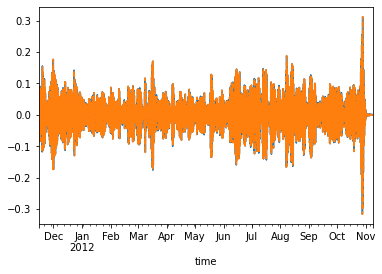

In [33]:
df_interp.zonal_velocity_hat_interp.dropna().plot()
#df_interp.zonal_velocity_hat_interp.dropna().plot(linestyle='--')
#plt.plot(df_interp.zonal_velocity_hat_interp.dropna().values.compute())

In [35]:
t_mid = int(360//2/dt)
dtime = int(5/dt)

/home1/datahome/zcaspar/miniconda3/envs/croco/lib/python3.8/site-packages/numpy/core/_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<AxesSubplot:xlabel='time'>

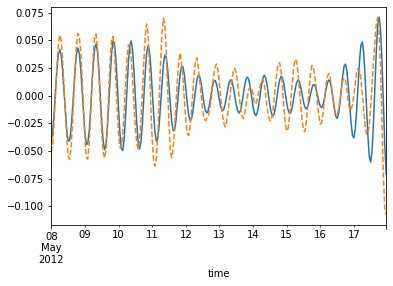

In [39]:
df_interp[t_mid-dtime:t_mid+dtime].zonal_velocity_hat.plot()
df_interp[t_mid-dtime:t_mid+dtime].zonal_velocity_hat_interp.plot(linestyle='--')

In [40]:
v = 'zonal_velocity'
df_interp = df_interp.groupby(df_interp.index).apply(interp_trajectories,ds_hat_interp,v,part='real')#.persist()



<AxesSubplot:xlabel='time'>

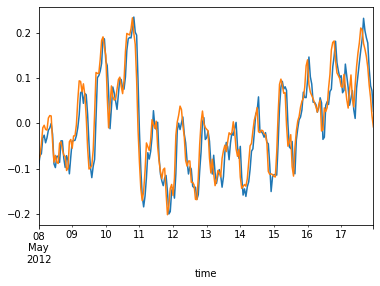

In [42]:
df_interp[t_mid-dtime:t_mid+dtime].zonal_velocity.plot()
df_interp[t_mid-dtime:t_mid+dtime].zonal_velocity_interp.plot(linestyle='-')

In [ ]:
def interp_sig(_df, dsi,v,time,method=None,part=None):
    idw_eta, neighbors = [],[]
    idw_eta_mid, neighbors_mid = [],[]
    
    for it in range(0,_df.index.values.size):
    #for t in time
        mesh = pyinterp.RTree()
        _dsi = dsi.isel(time=it)#
        if part=='real':
            var = np.real(_dsi[v].values)
        elif part=='imag':
            var = np.imag(_dsi[v].values)
        else:
            var = _dsi[v].values
        mesh.packing(np.vstack((_dsi.XC.values.flatten(), 
                                _dsi.YC.values.flatten())).T,
                         var.flatten(),
                        )
        if method:
            idw_eta.append(mesh.radial_basis_function(
                    np.vstack((_df.lon[it], _df.lat[it])).T,
                    within=True,
                    radius=None,
                    k=4,  
                    num_threads=0,
                    rbf=method)[0])
            neighbors.append(mesh.radial_basis_function(
                    np.vstack((_df.lon[it], _df.lat[it])).T,
                    within=True,
                    radius=None,
                    k=4,
                    num_threads=0,
                    rbf=method)[1])
            idw_eta_mid.append(mesh.radial_basis_function(
                        np.vstack((np.real(_df.lon[time.size//2]), np.real(_df.lat[time.size//2]))).T,
                        within=True,
                        radius=None,
                        k=4, 
                        num_threads=0,
                        rbf=method)[0])
            neighbors_mid.append(mesh.radial_basis_function(
                        np.vstack((np.real(_df.lon[time.size//2]), np.real(_df.lat[time.size//2]))).T,
                        within=True,
                        radius=None,
                        k=4,  
                        num_threads=0,
                        rbf=method)[1])
        else:    
            idw_eta.append(mesh.inverse_distance_weighting(
                    np.vstack((_df.lon[it], _df.lat[it])).T,
                    within=True,
                    radius=None,
                    k=4,  
                    num_threads=0)[0])
            neighbors.append(mesh.inverse_distance_weighting(
                    np.vstack((_df.lon[it], _df.lat[it])).T,
                    within=True,
                    radius=None,
                    k=4,  
                    num_threads=0)[1])
            idw_eta_mid.append(mesh.inverse_distance_weighting(
                        np.vstack((np.real(_df.lon[time.size//2]), np.real(_df.lat[time.size//2]))).T,
                        within=True,
                        radius=None,
                        k=4,  
                        num_threads=0)[0])
            neighbors_mid.append(mesh.inverse_distance_weighting(
                        np.vstack((np.real(_df.lon[time.size//2]), np.real(_df.lat[time.size//2]))).T,
                        within=True,
                        radius=None,
                        k=4,  
                        num_threads=0)[1])
    interp = idw_eta[0]
    for i in idw_eta[1:]:
        interp = np.insert(i,-1,interp)
    interp_mid = idw_eta_mid[0]
    for i in idw_eta_mid[1:]:
        interp_mid = np.insert(i,-1,interp_mid)
    return interp, interp_mid

In [ ]:
v = 'zonal_velocity_hat'
interp_hatr,interp_mid_hatr = interp_sig(_df1,dsi,v,_df1.index.values,part='real')
interp2_hatr,interp_mid2_hatr = interp_sig(_df2,dsi,v,_df2.index.values,part='real')



In [59]:
cluster.close()

distributed.client - ERROR - Failed to reconnect to scheduler after 10.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
asyncio.exceptions.CancelledError
